# Система прогнозирования пиковых нагрузок — полный пайплайн

**ВКР: «Разработка системы проактивного масштабирования веб-приложений»**

| Секция | Глава ВКР | Что делает |
|--------|-----------|------------|
| §3.4 EDA | Глава 3 | Загрузка данных, разведочный анализ |
| §4.1 Модели | Глава 4 | XGBoost (Random Search) + LSTM (Random Search) + NeuralProphet (Grid Search) |
| §4.2 Пики | Глава 4 | Детекция пиковых нагрузок |
| §4.3 Walk-Forward | Глава 4 | Адаптивное переобучение с ADWIN-детектором дрейфа |

> **Запускай ячейки строго сверху вниз** (Runtime → Run all, или по одной)

## 0. Установка и клонирование

In [ ]:
!git fetch origin && git reset --hard origin/main

fatal: not a git repository (or any of the parent directories): .git


In [37]:
import os, sys

REPO_DIR = '/content/peak_predictor'

if not os.path.exists(REPO_DIR):
    !git clone https://github.com/TurbanovRoman/peak-load-predictor.git {REPO_DIR}
else:
    !git -C {REPO_DIR} fetch origin
    !git -C {REPO_DIR} reset --hard origin/main

if REPO_DIR not in sys.path:
    sys.path.insert(0, REPO_DIR)
os.chdir(REPO_DIR)

fatal: ambiguous argument 'origin/main': unknown revision or path not in the working tree.
Use '--' to separate paths from revisions, like this:
'git <command> [<revision>...] -- [<file>...]'


In [ ]:
!pip install -q xgboost "neuralprophet==0.8.0" "pytorch-lightning==1.9.5" tensorflow scikit-learn pandas "numpy<2.0" \
               matplotlib seaborn river joblib prophet optuna


In [ ]:
def _noop(*args, **kwargs): return None

for _mod_path in [
    "pytorch_lightning.trainer.connectors.callback_connector",
    "lightning.pytorch.trainer.connectors.callback_connector",
]:
    try:
        import importlib
        _mod = importlib.import_module(_mod_path)
        for _cls_name in ["_CallbackConnector", "CallbackConnector"]:
            _cls = getattr(_mod, _cls_name, None)
            if _cls and hasattr(_cls, "_check_progress_bar"):
                _cls._check_progress_bar = _noop
                print(f"Патч применён: {_mod_path}.{_cls_name}")
    except Exception as _e:
        pass

In [ ]:
import pytorch_lightning.trainer.connectors.callback_connector as _cc

cls = _cc.CallbackConnector
# Показать все методы связанные с progress
print([m for m in dir(cls) if 'progress' in m.lower() or 'bar' in m.lower()])

# Патчим всё что найдём
for _m in [m for m in dir(cls) if 'progress' in m.lower() or 'bar' in m.lower()]:
    setattr(cls, _m, lambda *a, **kw: None)
    print(f"Патч: {_m}")

['_configure_progress_bar']
Патч: _configure_progress_bar


## 1. Конфигурация — измени CSV_PATH под свои данные

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

# ================================================================
# НАСТРОЙКА — меняй только здесь
# ================================================================

CSV_PATH  = "/content/drive/MyDrive/Colab Notebooks/SDV_hourly.csv"
SAVE_DIR  = "/content/results"

# True = пропустить NeuralProphet (~15 мин экономии)
FAST_MODE = False

# Walk-Forward
WF_N_FRESH    = 200   # принудительный retrain каждые N шагов
WF_CONFIRM_N  = 10    # подтверждение ADWIN (шагов подряд)
WF_TEST_LIMIT = 500   # None = все точки теста

# ================================================================

os.makedirs(SAVE_DIR, exist_ok=True)
print(f'CSV_PATH : {CSV_PATH}')
print(f'SAVE_DIR : {SAVE_DIR}')
print(f'FAST_MODE: {FAST_MODE}')

CSV_PATH : /content/drive/MyDrive/Colab Notebooks/SDV_hourly.csv
SAVE_DIR : /content/results
FAST_MODE: False


### Настройка визуализации

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'font.sans-serif': ['DejaVu Sans'],
    'font.size': 16,

    # Рамка
    'axes.edgecolor': '#000000',
    'axes.linewidth': 0.5,

    # --- ВКЛЮЧЕНИЕ СЕТКИ (ДОБАВЛЕНО) ---
    'axes.grid': True,              # Эта строка включает сетку
    'grid.color': '#eaeaf2',        # Цвет сетки
    'grid.linestyle': '-',          # Сплошная линия
    'grid.alpha': 1,              # Прозрачность (0.0 - 1.0)
    # ----------------------------------

    # Засечки
    'xtick.major.size': 3,
    'xtick.major.width': 0.5,
    'ytick.major.size': 3,
    'ytick.major.width': 0.5,
    'xtick.direction': 'out',
    'ytick.direction': 'out',

    'xtick.color': '#000000',
    'ytick.color': '#000000',
})


## 2. Монтирование Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Загрузка данных

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
from google.colab import files
warnings.filterwarnings('ignore')

import config as _cfg
from data_collection.csv_loader import load_csv

df = load_csv(CSV_PATH, extra_cols=getattr(_cfg, "EXOG_COLS", []))
df['ds'] = pd.to_datetime(df['ds']) - pd.DateOffset(years=4)  # 2023 → 2019

# Имитация пропусков (сбои сбора метрик)
rng = np.random.default_rng(42)
mask = rng.random(len(df)) < 0.02
df.loc[mask, "y"] = np.nan
df.loc[150:152, "y"] = np.nan
df.loc[800:803, "y"] = np.nan

  timestamp → 'ds',  value → 'y'


### NASA

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
import zipfile
warnings.filterwarnings('ignore')

# ── Загрузка NASA датасета ────────────────────────────────────────────────────
ZIP_PATH = '/content/drive/MyDrive/NASA Dataset for LSTM.csv (1).zip'
NASA_CSV  = '/content/nasa_prepared.csv'

with zipfile.ZipFile(ZIP_PATH, 'r') as z:
    csv_files = [n for n in z.namelist() if n.endswith('.csv')]
    with z.open(csv_files[0]) as f:
        raw = pd.read_csv(f)

print('Исходные колонки:', raw.columns.tolist())
print(raw.head(3))

# ── Колонки NASA: 'minute' / 'count' ─────────────────────────────────────────
ts_col  = 'minute'   # колонка с временем
val_col = 'count'    # колонка с нагрузкой

df = raw[[ts_col, val_col]].rename(columns={ts_col: 'ds', val_col: 'y'})
df['ds'] = pd.to_datetime(df['ds'])
df = df.dropna(subset=['ds']).sort_values('ds').reset_index(drop=True)

# ── Ресемплинг: минуты → часы (сумма запросов за час) ────────────────────────
df = df.set_index('ds').resample('h')['y'].sum().reset_index()

# ── Сдвиг дат: 1995 → 2019 (+24 года) ───────────────────────────────────────
df['ds'] = df['ds'] + pd.DateOffset(years=24)

# ── Имитация пропусков ────────────────────────────────────────────────────────
rng = np.random.default_rng(42)
mask = rng.random(len(df)) < 0.02
df.loc[mask, 'y'] = np.nan
df.loc[150:152, 'y'] = np.nan
df.loc[800:803, 'y'] = np.nan

# ── Сохраняем для следующих ячеек ─────────────────────────────────────────────
df.to_csv(NASA_CSV, index=False)
CSV_PATH = NASA_CSV

import config as _cfg
_cfg.EXOG_COLS = []

print(f'\nГотово: {len(df)} часов | {df["ds"].min()} → {df["ds"].max()}')
print(f'Пропусков: {df["y"].isna().sum()} | Макс RPS: {df["y"].max():.0f}')

Исходные колонки: ['minute', 'count']
                minute  count
0  1995-07-01 00:00:00     42
1  1995-07-01 00:01:00     61
2  1995-07-01 00:02:00     57

Готово: 1488 часов | 2019-07-01 00:00:00 → 2019-08-31 23:00:00
Пропусков: 33 | Макс RPS: 14926


## §3.4 — EDA

In [ ]:
# Таблица исходная
import pandas as pd
df_raw = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/SDV_hourly.csv", nrows=3)
print(df_raw.columns.tolist())
print(df_raw.head(3))

['ds', 'rps', 'is_weekend', 'hour', 'day_of_week', 'is_holiday', 'is_campaign', 'is_promo']
                    ds          rps  is_weekend  hour  day_of_week  \
0  2023-01-01 00:00:00  4202.060764           1     0            6   
1  2023-01-01 01:00:00  4120.802737           1     1            6   
2  2023-01-01 02:00:00  4112.734845           1     2            6   

   is_holiday  is_campaign  is_promo  
0           1            0         0  
1           1            0         0  
2           1            0         0  


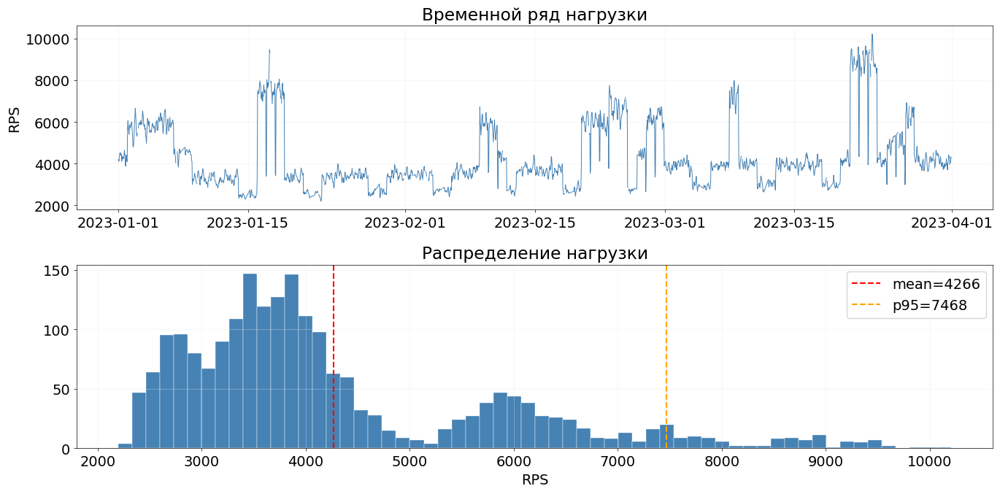

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(14, 7))

ax = axes[0]
ax.plot(df['ds'], df['y'], linewidth=0.7, color='steelblue')
ax.set_title('Временной ряд нагрузки')
ax.set_ylabel('RPS'); ax.grid(alpha=0.3)

ax = axes[1]
ax.hist(df['y'], bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
ax.axvline(df['y'].mean(),          color='red',    linestyle='--', label=f'mean={df["y"].mean():.0f}')
ax.axvline(df['y'].quantile(0.95),  color='orange', linestyle='--', label=f'p95={df["y"].quantile(0.95):.0f}')
ax.set_title('Распределение нагрузки'); ax.set_xlabel('RPS')
ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/eda_overview.png', dpi=150)
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

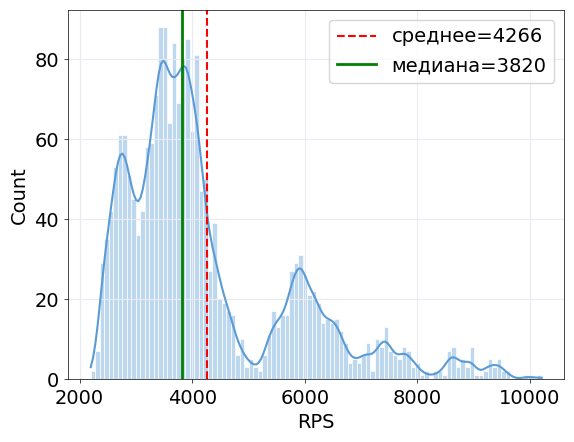

In [ ]:
import seaborn as sns
sns.histplot(
    data=df,
    x=df['y'],
    bins=100,
    kde=True,
    fill=True,
    color='#5b9bd5',
    alpha=0.4,
    edgecolor='white',
    linewidth=0.5,
    kde_kws={"bw_adjust": 0.3},  # ← меньше = точнее следует столбцам
)
plt.axvline(df['y'].mean(),
            color='red',
            linestyle='--',
            label=f'среднее={df["y"].mean():.0f}')

# Добавляем МЕДИАНУ (добавленная строка)
plt.axvline(df['y'].median(),
            color='green',
            linestyle='-',
            linewidth=2,
            label=f'медиана={df["y"].median():.0f}')

# Важно: добавляем легенду, чтобы метки отобразились
plt.legend()
plt.xlabel('RPS')
plt.savefig('histogram.svg', format='svg', bbox_inches='tight')
files.download("histogram.svg")

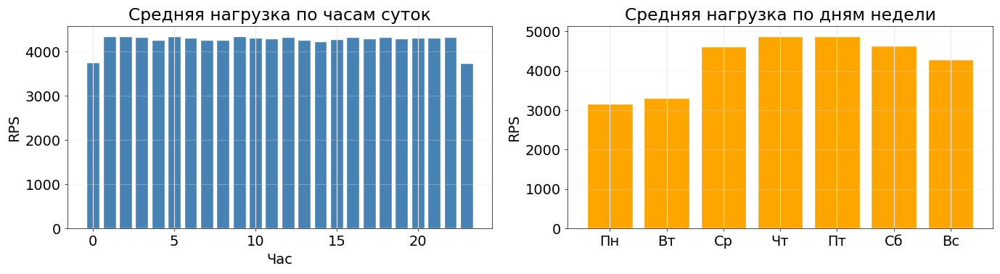

In [ ]:
df['hour']      = pd.to_datetime(df['ds']).dt.hour
df['dayofweek'] = pd.to_datetime(df['ds']).dt.dayofweek
dow_names = ['Пн','Вт','Ср','Чт','Пт','Сб','Вс']

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

hourly = df.groupby('hour')['y'].mean()
axes[0].bar(hourly.index, hourly.values, color='steelblue', edgecolor='white')
axes[0].set_title('Средняя нагрузка по часам суток')
axes[0].set_xlabel('Час'); axes[0].set_ylabel('RPS'); axes[0].grid(alpha=0.3, axis='y')

daily = df.groupby('dayofweek')['y'].mean()
axes[1].bar([dow_names[i] for i in daily.index], daily.values, color='orange', edgecolor='white')
axes[1].set_title('Средняя нагрузка по дням недели')
axes[1].set_ylabel('RPS'); axes[1].grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/eda_seasonality.png', dpi=150)
plt.show()

df.drop(columns=['hour', 'dayofweek'], inplace=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

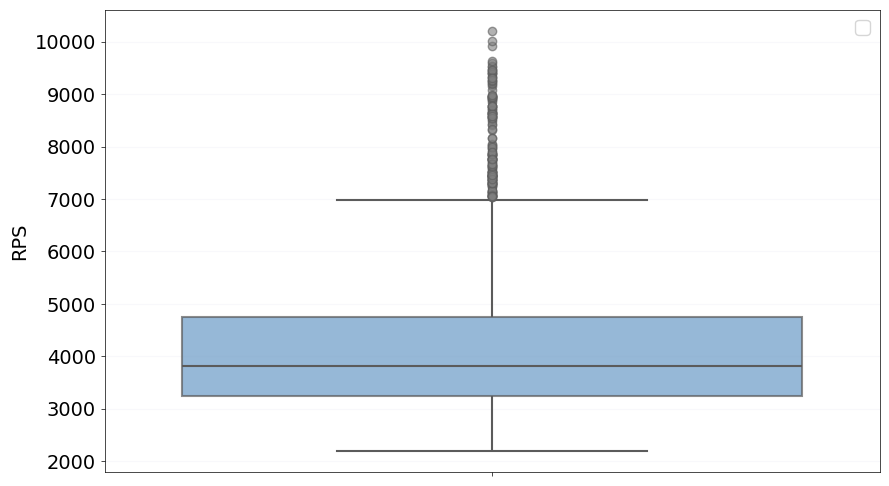


=== СТАТИСТИКА ===
Среднее: 4265.69
Медиана: 3819.69
Q1 (25й перцентиль): 3248.22
Q3 (75й перцентиль): 4756.56
IQR: 1508.34
Нижний ус: 985.71
Верхний ус: 7019.08
Количество выбросов: 154


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from google.colab import files

# Создаем пример данных (если у вас нет своего df)


plt.figure(figsize=(10, 6))

# Исправленный boxplot - убираем alpha из основного вызова
box = sns.boxplot(data=df, y='y',
                  color='#5b9bd5',
                  linewidth=1.5,
                  fliersize=5,
                  flierprops={'marker': 'o',
                             'markerfacecolor': 'gray',
                             'markersize': 6,
                             'alpha': 0.6},
                  boxprops={'alpha': 0.7})  # alpha переносим в boxprops

# Добавляем статистику
mean_val = df['y'].mean()
median_val = df['y'].median()
q1 = df['y'].quantile(0.25)
q3 = df['y'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr


# Добавляем текстовую информацию на график
stats_text = f'Q1 = {q1:.1f}\nМедиана = {median_val:.1f}\nQ3 = {q3:.1f}\nIQR = {iqr:.1f}'
ax.text(0.02, 0.98, stats_text, fontsize=10,
        transform=ax.transAxes,  # используем относительные координаты
        verticalalignment='top',  # выравнивание по верхнему краю
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

# plt.title('Ящик с усами (Boxplot)', fontsize=14)
plt.ylabel('RPS')
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Сохраняем и скачиваем
plt.savefig('boxplot_fixed.svg', format='svg', bbox_inches='tight')
files.download('boxplot_fixed.svg')
plt.show()

# Выводим статистику в консоль
print("\n=== СТАТИСТИКА ===")
print(f"Среднее: {mean_val:.2f}")
print(f"Медиана: {median_val:.2f}")
print(f"Q1 (25й перцентиль): {q1:.2f}")
print(f"Q3 (75й перцентиль): {q3:.2f}")
print(f"IQR: {iqr:.2f}")
print(f"Нижний ус: {lower_whisker:.2f}")
print(f"Верхний ус: {upper_whisker:.2f}")
print(f"Количество выбросов: {sum((df['y'] < lower_whisker) | (df['y'] > upper_whisker))}")

In [ ]:
df.head()

,ds,y,is_holiday,is_campaign,is_promo
0,2019-01-01 00:00:00,4202.060764,1,0,0
1,2019-01-01 01:00:00,4120.802737,1,0,0
2,2019-01-01 02:00:00,4112.734845,1,0,0
3,2019-01-01 03:00:00,4380.374572,1,0,0
4,2019-01-01 04:00:00,4504.746634,1,0,0


## Разбиение train / val / test

Train : 992 (2019-07-01 00:00:00 → 2019-08-11 07:00:00)
Val   : 248 (2019-08-11 08:00:00 → 2019-08-21 15:00:00)
Test  : 248 (2019-08-21 16:00:00 → 2019-08-31 23:00:00)


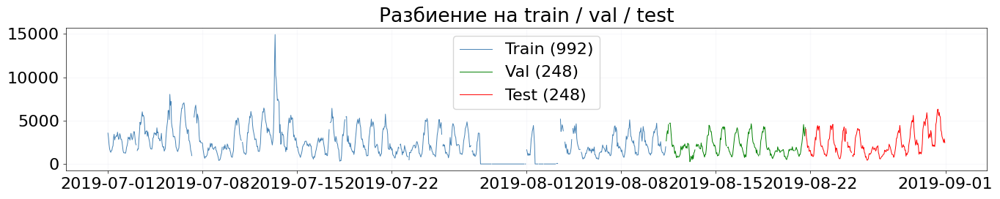

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import pandas as pd
import matplotlib.pyplot as plt

from preprocessing.feature_engineering import split_train_val_test

n = len(df)
TEST_H = min(480, n // 6)
VAL_H  = TEST_H

train, val, test = split_train_val_test(df, test_hours=TEST_H, val_hours=VAL_H)
print(f'Train : {len(train)} ({train["ds"].iloc[0]} → {train["ds"].iloc[-1]})')
print(f'Val   : {len(val)} ({val["ds"].iloc[0]} → {val["ds"].iloc[-1]})')
print(f'Test  : {len(test)} ({test["ds"].iloc[0]} → {test["ds"].iloc[-1]})')

train.to_csv(f'{SAVE_DIR}/train.csv', index=False)
val.to_csv(f'{SAVE_DIR}/val.csv', index=False)
test.to_csv(f'{SAVE_DIR}/test.csv', index=False)

fig, ax = plt.subplots(figsize=(14, 3))
ax.plot(train['ds'], train['y'], color='steelblue', linewidth=0.7, label=f'Train ({len(train)})')
ax.plot(val['ds'],   val['y'],   color='green',     linewidth=0.7, label=f'Val ({len(val)})')
ax.plot(test['ds'],  test['y'],  color='red',        linewidth=0.7, label=f'Test ({len(test)})')
ax.set_title('Разбиение на train / val / test')
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/data_split.png', dpi=150)
plt.show()

## §4.1 — Сравнение моделей (с подбором гиперпараметров)

- **XGBoost** — Random Search, 30 итераций, 7 параметров
- **LSTM** — Random Search, 10 итераций, 5 параметров, Huber loss
- **NeuralProphet** — Grid Search, 8 комбинаций (отключается `FAST_MODE=True`)

In [ ]:
import os, sys
import importlib
import pandas as pd
import numpy as np

REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

from models.model_comparison import ModelComparison
from preprocessing.feature_engineering import split_train_val_test, _infer_step_minutes, _hours_to_periods
from data_collection.csv_loader import load_csv
import config as _cfg

importlib.reload(_cfg)

df_full = load_csv(CSV_PATH, extra_cols=_cfg.EXOG_COLS)
print(f"Экзогенные признаки: {_cfg.EXOG_COLS}")

from preprocessing.data_cleaning import TimeSeriesCleaner
cleaner = TimeSeriesCleaner()
cleaner.fit(df_full)
df_clean, clean_stats = cleaner.transform(df_full)
print(f"Выбросов удалено : {clean_stats.get('n_outliers_removed', 0)}")
print(f"Пиков сохранено  : {clean_stats.get('n_peaks_preserved', 0)}")

n = len(df_clean)
TEST_H = min(480, n // 6)
VAL_H  = TEST_H
train, val, test = split_train_val_test(df_clean, test_hours=TEST_H, val_hours=VAL_H)

step_min    = _infer_step_minutes(pd.to_datetime(train['ds']))
lstm_window = max(12, min(_hours_to_periods(24, step_min), 288))
print(f'Шаг данных: {step_min} мин  |  LSTM window_size: {lstm_window}')

import logging
logging.basicConfig(level=logging.INFO)
comparator = ModelComparison(model_save_dir=SAVE_DIR)
results = comparator.run(
    train, val, test,
    include_prophet = not FAST_MODE,
    include_lstm    = True,
)

comparator.save_best()
best_name, best_model = comparator.best_model()
print(f'\nЛучшая модель: {best_name}')

from preprocessing.feature_engineering import FeatureBuilder
from models.xgboost_model import predict_xgboost
import xgboost as xgb

# ── Признаки через transform_splits — те же что у comparator ─────────────────
builder_q = FeatureBuilder(exog_cols=_cfg.EXOG_COLS)
(X_tr, y_tr), (X_vl, y_vl), (X_te, y_te) = builder_q.transform_splits(train, val, test)

# ── Оптимальные параметры из comparator ──────────────────────────────────────
best_params = comparator.models_['XGBoost'].get_params()

# ── Квантильные модели для доверительного интервала ───────────────────────────
def _fit_quantile(quantile, save_path):
    m = xgb.XGBRegressor(
        objective="reg:quantileerror",
        quantile_alpha=quantile,
        n_estimators=500,
        early_stopping_rounds=20,
        eval_metric="quantile",
        max_depth=        best_params['max_depth'],
        learning_rate=    best_params['learning_rate'],
        subsample=        best_params['subsample'],
        colsample_bytree= best_params['colsample_bytree'],
        min_child_weight= best_params['min_child_weight'],
        reg_alpha=        best_params['reg_alpha'],
        reg_lambda=       best_params['reg_lambda'],
        verbosity=0,
        random_state=42,
    )
    m.fit(X_tr, y_tr, eval_set=[(X_vl, y_vl)], verbose=False)
    import joblib
    joblib.dump(m, save_path)
    return m

q10_model = _fit_quantile(0.1, f'{SAVE_DIR}/xgb_q10.pkl')
q90_model = _fit_quantile(0.9, f'{SAVE_DIR}/xgb_q90.pkl')

lower = np.clip(q10_model.predict(X_te), 0, None)
upper = np.clip(q90_model.predict(X_te), 0, None)
print(f'Q10/Q90 обучены. Средняя ширина интервала: {np.mean(upper - lower):.0f} RPS')


  timestamp → 'ds',  value → 'y'
Экзогенные признаки: ['is_holiday', 'is_campaign', 'is_promo']
Выбросов удалено : 198
Пиков сохранено  : 62
Шаг данных: 60.0 мин  |  LSTM window_size: 24
СРАВНЕНИЕ МОДЕЛЕЙ ПРОГНОЗИРОВАНИЯ

[1/3] XGBoost...
  XGBoost Optuna TPE: 30 trials...


  0%|          | 0/30 [00:00<?, ?it/s]

  XGBoost Optuna завершён: RMSE=548.3749  params={'max_depth': 3, 'learning_rate': 0.03258504048390841, 'subsample': 0.6866524980663049, 'colsample_bytree': 0.8122796553720691, 'min_child_weight': 5, 'reg_alpha': 0.29882331265309325, 'reg_lambda': 1.7209905583667473}
  XGBoost              MAE=  595.34  RMSE=  827.33  MAPE= 10.89%

[2/3] LSTM...
  LSTM Optuna TPE: 15 trials × 20 эпох поиска...


  0%|          | 0/15 [00:00<?, ?it/s]

  LSTM TPE: все trials упали, fallback на фиксированные параметры
  LSTM                 MAE=  664.42  RMSE=  943.56  MAPE= 11.93%

[3/3] NeuralProphet (AR-Net + декомпозиция)...


ERROR:NP.plotly:Importing plotly failed. Interactive plots will not work.
ERROR:NP.plotly:Importing plotly failed. Interactive plots will not work.


  NeuralProphet: freq=h, n_lags=24, epochs=50, yearly=False
  NeuralProphet Optuna search: 15 trials


  0%|          | 0/15 [00:00<?, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
INFO - (NP.config.__post_init__) - Note: Fourier-based seasonality regularization is experimental.
INFO:NP.config:Note: Fourier-based seasonality regularization is experimental.
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (45) is too small than the required number                     for the learning rate finder (229). The results might not be optimal.


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

  Best NeuralProphet: {'n_changepoints': 10, 'trend_reg': 0.8580222514877407, 'seasonality_reg': 0.902165560356813, 'ar_reg': 0.08756324638155137}  →  val MAE=418.30
  NeuralProphet обучен: n_lags=24, freq=h


Predicting: 45it [00:00, ?it/s]

  NeuralProphet        MAE=  563.86  RMSE=  765.39  MAPE= 10.89%
--------------------------------------------------------------

Модель                       MAE      RMSE   MAPE%   Время,с
--------------------------------------------------------------
  XGBoost                     595.34    827.33  10.89%     6.98
  LSTM                        664.42    943.56  11.93%   381.81
  NeuralProphet [*]           563.86    765.39  10.89%   420.67
--------------------------------------------------------------
  [*] - best model by MAE


Лучшая модель по MAE: NeuralProphet
Best model (NeuralProphet) saved -> /content/results/best_NeuralProphet.np

Лучшая модель: NeuralProphet
Q10/Q90 обучены. Средняя ширина интервала: 1471 RPS


### Таблица метрик

In [ ]:
# Таблица метрик
import pandas as pd

SHOW = ['MAE', 'RMSE', 'MAPE', 'train_time_s']
rows = []
for name, m in comparator.results_.items():
    if name == "FBProphet":
        continue
    row = {'Модель': name}
    row.update({c: m.get(c, float('nan')) for c in SHOW})
    if 'mae_train' in m:
        row['MAE_train']  = m['mae_train']
        row['MAE_val']    = m['mae_val']
        row['overfit']    = m['overfit_ratio']
    rows.append(row)

metrics_df = pd.DataFrame(rows).set_index('Модель').round(3)
metrics_df.to_csv(f'{SAVE_DIR}/metrics_comparison.csv')
display(metrics_df)

,MAE,RMSE,MAPE,train_time_s
Модель,,,,
XGBoost,595.337,827.333,10.888,6.93
LSTM,687.928,973.918,12.527,456.01
NeuralProphet,561.354,768.995,10.773,544.16


### Визуализация метрик

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

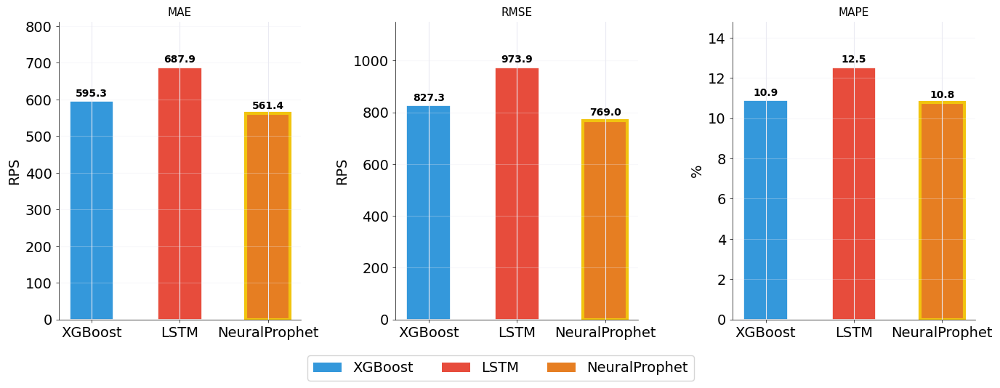

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

models = metrics_df.index.tolist()
metrics_to_plot = [
    ('MAE',  'MAE', 'RPS'),
    ('RMSE', 'RMSE',          'RPS'),
    ('MAPE', 'MAPE',                   '%'),
]

# Add NeuralProphet to colors dictionary
colors = {'XGBoost': '#3498db', 'Prophet': '#95a5a6', 'LSTM': '#e74c3c', 'NeuralProphet': '#e67e22'}
bar_colors = [colors.get(m, '#bdc3c7') for m in models]

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
# fig.suptitle('Сравнение моделей прогнозирования', fontsize=14, fontweight='bold')

for ax, (col, title, ylabel) in zip(axes, metrics_to_plot):
    vals = metrics_df[col].values
    bars = ax.bar(models, vals, color=bar_colors, edgecolor='white',
                  linewidth=1.2, width=0.5)

    # подписи над столбцами
    for bar, v in zip(bars, vals):
        if not np.isnan(v):
            ax.text(bar.get_x() + bar.get_width() / 2,
                    bar.get_height() + max(vals) * 0.01,
                    f'{v:.1f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

    # выделяем лучший (минимальный) золотой рамкой
    best_idx = int(np.nanargmin(vals))
    bars[best_idx].set_edgecolor('#f1c40f')
    bars[best_idx].set_linewidth(3)

    ax.set_title(title, fontsize=11)
    ax.set_ylabel(ylabel)
    ax.set_ylim(0, max(vals) * 1.18)
    ax.grid(axis='y', alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# легенда
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=c, label=m) for m, c in colors.items() if m in models]
# legend_elements.append(Patch(facecolor='white', edgecolor='#f1c40f', linewidth=2, label='Лучший'))
fig.legend(handles=legend_elements, loc='lower center', ncol=5,  # Changed ncol to 5 (from 4) to accommodate extra model
           bbox_to_anchor=(0.5, -0.09), fontsize=14)
plt.tight_layout()
plt.savefig('srav.svg')
files.download("srav.svg")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from preprocessing.feature_engineering import FeatureBuilder
from models.xgboost_model import predict_xgboost
from models.neural_prophet_model import predict_neural_prophet

# ── Признаки ──────────────────────────────────────────────────────────────────
builder_q = FeatureBuilder(exog_cols=_cfg.EXOG_COLS)

X_tr, y_tr = builder_q.get_X_y(train)
X_vl, y_vl = builder_q.get_X_y(val)

# ── Conformal Prediction — NeuralProphet ──────────────────────────────────────
upper_np = None
if 'NeuralProphet' in comparator.models_:
    np_model = comparator.models_['NeuralProphet']

    preds_val_np = predict_neural_prophet(
        np_model, train_val_df=train, test_df=val
    )
    n_vl         = min(len(preds_val_np), len(y_vl))
    residuals_np = y_vl.values[:n_vl] - preds_val_np[:n_vl]

    q_hi_np = np.percentile(residuals_np, 90)
    print(f"NeuralProphet Q90 сдвиг: +{q_hi_np:.0f} RPS")

    preds_te_np = comparator.predictions_['NeuralProphet']
    upper_np    = np.clip(preds_te_np + q_hi_np, 0, None)
    print(f"NeuralProphet средний Q90: {np.mean(upper_np):.0f} RPS")

# ── График ────────────────────────────────────────────────────────────────────
preds_xgb = comparator.predictions_['XGBoost']
n         = len(preds_xgb)
test_z    = test.iloc[:n]

fig, ax = plt.subplots(figsize=(14, 5))

# Факт
ax.plot(test_z['ds'], test_z['y'],
        color='#27ae60', label='Тест', linewidth=2, zorder=5)

# XGBoost — только линия
ax.plot(test_z['ds'], np.clip(preds_xgb, 0, None),
        color='#8e44ad', label='XGBoost', linewidth=1.8)

# NeuralProphet — линия + верхний ДИ
if 'NeuralProphet' in comparator.predictions_:
    preds_np = comparator.predictions_['NeuralProphet']
    ax.plot(test_z['ds'], np.clip(preds_np[:n], 0, None),
            color='#e74c3c', label='NeuralProphet', linewidth=1.8, linestyle='--')
    if upper_np is not None:
        n_ci = min(n, len(upper_np))
        ax.fill_between(test_z['ds'][:n_ci],
                        np.clip(preds_np[:n_ci], 0, None),
                        upper_np[:n_ci],
                        alpha=0.15, color='#e74c3c', label='NeuralProphet Q90')

ax.set_ylabel('RPS')
ax.legend(fontsize=16, loc='upper left')
ax.grid(alpha=0.3)
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig('predictive.svg')
# files.download('predictive.svg')

NameError: name 'comparator' is not defined

### LSTM

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

preds_xgb  = comparator.predictions_.get('XGBoost')
preds_lstm = comparator.predictions_.get('LSTM')

n = min(len(p) for p in [preds_xgb, preds_lstm] if p is not None)
test_z = test.iloc[:n]

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(test_z['ds'], test_z['y'],
        color='#27ae60', label='Факт', linewidth=2, zorder=5)

if preds_xgb is not None:
    ax.plot(test_z['ds'], np.clip(preds_xgb[:n], 0, None),
            color='#e74c3c', label='XGBoost', linewidth=1.8, linestyle='--')

if preds_lstm is not None:
    ax.plot(test_z['ds'], np.clip(preds_lstm[:n], 0, None),
            color='steelblue', label='LSTM', linewidth=1.8, linestyle=':')

ax.set_ylabel('RPS')
ax.legend(fontsize=14, loc='upper left')
ax.grid(alpha=0.3)
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig('predictive.svg')

### многошаговый

  Горизонт    MAE XGBoost     MAE LSTM
----------------------------------------
       1ч          129.6            —
       6ч          272.4            —
      12ч          264.9            —
      24ч          354.9            —


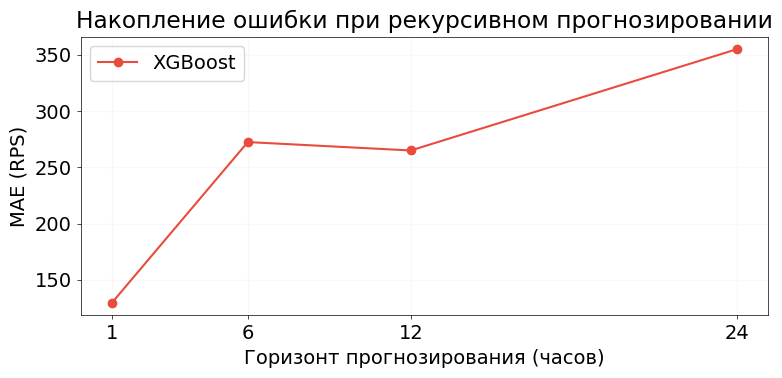

In [ ]:
from models.multistep import recursive_forecast
from models.forecasters import predict_xgboost_wf, predict_lstm_wf
from preprocessing.feature_engineering import FeatureBuilder
import matplotlib.pyplot as plt
import numpy as np

history = pd.concat([train, val]).tail(300).reset_index(drop=True)
builder_ms = FeatureBuilder()

horizons = [1, 6, 12, 24]
results  = {}

for h in horizons:
    # XGBoost
    fc_xgb = recursive_forecast(
        history_df=history,
        model=comparator.models_['XGBoost'],
        predict_fn=predict_xgboost_wf,
        builder=builder_ms,
        horizon=h,
    )
    # LSTM (если есть)
    fc_lstm = None
    if 'LSTM' in comparator.models_:
        try:
            fc_lstm = recursive_forecast(
                history_df=history,
                model=comparator.models_['LSTM'],
                predict_fn=predict_lstm_wf,
                builder=builder_ms,
                horizon=h,
            )
        except Exception:
            pass
    results[h] = {'xgb': fc_xgb, 'lstm': fc_lstm}

# MAE по горизонтам
print(f"{'Горизонт':>10} {'MAE XGBoost':>14} {'MAE LSTM':>12}")
print('-' * 40)
for h in horizons:
    fc_xgb = results[h]['xgb']
    actual = test['y'].values[:h]
    mae_xgb = np.mean(np.abs(actual - fc_xgb['y_hat'].values[:h]))

    fc_lstm = results[h]['lstm']
    if fc_lstm is not None:
        mae_lstm = np.mean(np.abs(actual - fc_lstm['y_hat'].values[:h]))
        print(f"{h:>8}ч   {mae_xgb:>12.1f}   {mae_lstm:>10.1f}")
    else:
        print(f"{h:>8}ч   {mae_xgb:>12.1f}   {'—':>10}")

# График: как нарастает ошибка с горизонтом
mae_xgb_list = []
for h in horizons:
    fc  = results[h]['xgb']
    act = test['y'].values[:h]
    mae_xgb_list.append(np.mean(np.abs(act - fc['y_hat'].values[:h])))

fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(horizons, mae_xgb_list, marker='o', color='#e74c3c', label='XGBoost')
ax.set_xlabel('Горизонт прогнозирования (часов)')
ax.set_ylabel('MAE (RPS)')
ax.set_title('Накопление ошибки при рекурсивном прогнозировании')
ax.set_xticks(horizons)
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('multistep_mae.svg')
plt.show()

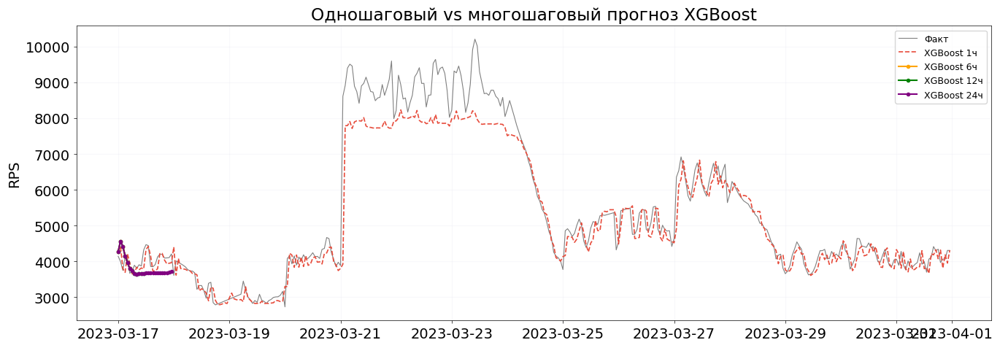

In [ ]:
fig, ax = plt.subplots(figsize=(14, 5))

# Весь тест — факт
ax.plot(test['ds'], test['y'], color='gray', linewidth=0.8, label='Факт')

# Одношаговый XGBoost по всему тесту
preds_1 = comparator.predictions_['XGBoost']
ax.plot(test['ds'].values[:len(preds_1)], preds_1,
        color='#e74c3c', linewidth=1.2, linestyle='--', label='XGBoost 1ч')

# Многошаговые — только первые h точек от начала теста
history = pd.concat([train, val]).tail(300).reset_index(drop=True)
for h, color in [(6,'orange'), (12,'green'), (24,'purple')]:
    fc = recursive_forecast(
        history_df=history,
        model=comparator.models_['XGBoost'],
        predict_fn=predict_xgboost_wf,
        builder=FeatureBuilder(),
        horizon=h,
    )
    ax.plot(fc['ds'].values, fc['y_hat'].values,
            color=color, linewidth=1.5, marker='o', markersize=3,
            label=f'XGBoost {h}ч')

ax.set_ylabel('RPS')
ax.set_title('Одношаговый vs многошаговый прогноз XGBoost')
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### Важность признаков XGBoost

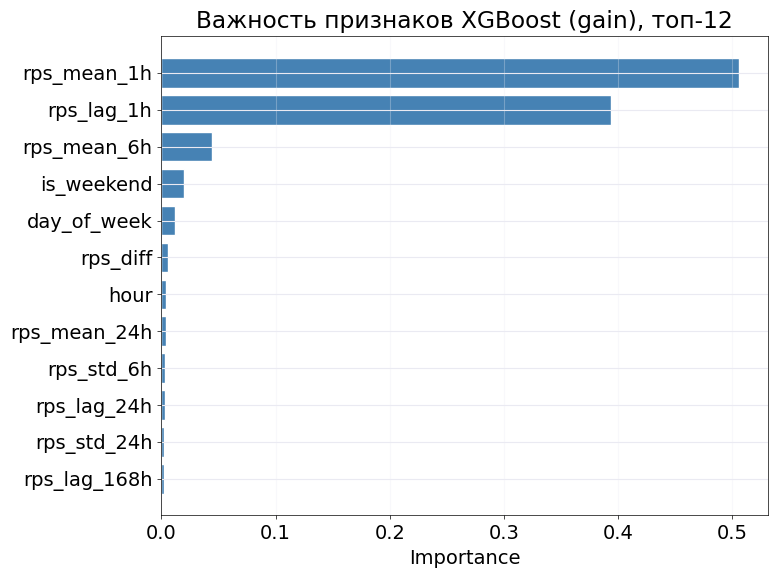

     feature  importance
 rps_mean_1h    0.505988
  rps_lag_1h    0.394209
 rps_mean_6h    0.044005
  is_weekend    0.019364
 day_of_week    0.011854
    rps_diff    0.005897
        hour    0.004033
rps_mean_24h    0.003684
  rps_std_6h    0.003292
 rps_lag_24h    0.003143
 rps_std_24h    0.002475
rps_lag_168h    0.002056
  rps_std_1h    0.000000


In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import joblib, numpy as np
import matplotlib.pyplot as plt
from models.xgboost_model import feature_importance
from preprocessing.feature_engineering import FeatureBuilder

xgb_model = comparator.models_.get('XGBoost') or joblib.load(f'{SAVE_DIR}/xgboost.pkl')
builder   = FeatureBuilder()
X_tr_fi, _ = builder.get_X_y(train)

imp_df = feature_importance(xgb_model, feature_names=list(X_tr_fi.columns))
imp_df.to_csv(f'{SAVE_DIR}/feature_importance.csv', index=False)

fig, ax = plt.subplots(figsize=(8, 6))
top12 = imp_df.head(12).iloc[::-1]
ax.barh(top12['feature'], top12['importance'], color='steelblue', edgecolor='white')
ax.set_title('Важность признаков XGBoost (gain), топ-12')
ax.set_xlabel('Importance'); ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/feature_importance.png', dpi=150)
plt.show()
print(imp_df.to_string(index=False))

### Доверительный интервал (квантильная регрессия 10–90%)

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import numpy as np
import matplotlib.pyplot as plt
from models.xgboost_model import get_confidence_interval
from evaluation.metrics import plot_forecast
from preprocessing.feature_engineering import FeatureBuilder

builder_ci = FeatureBuilder()
(X_tr, y_tr), (X_vl, y_vl), (X_te, y_te) = builder_ci.transform_splits(train, val, test)

print('Обучение квантильных моделей (q=0.10 и q=0.90)...')
lower, upper = get_confidence_interval(X_tr, y_tr, X_vl, y_vl, X_te, save_dir=SAVE_DIR)

xgb_preds = comparator.predictions_.get('XGBoost')
plot_forecast(train, val, test, xgb_preds, 'XGBoost',
              lower=lower, upper=upper,
              save_path=f'{SAVE_DIR}/forecast_xgb_ci.png', zoom=False)
plot_forecast(train, val, test, xgb_preds, 'XGBoost',
              lower=lower, upper=upper,
              save_path=f'{SAVE_DIR}/forecast_xgb_ci_zoom.png', zoom=True)
plt.show()

# Экспорт предсказаний с CI
pred_df = test[['ds','y']].iloc[:len(xgb_preds)].copy().reset_index(drop=True)
for name, p in comparator.predictions_.items():
    pred_df[name] = np.array(p[:len(pred_df)])
pred_df['XGBoost_lower'] = lower[:len(pred_df)]
pred_df['XGBoost_upper'] = upper[:len(pred_df)]
pred_df.to_csv(f'{SAVE_DIR}/predictions.csv', index=False)
print(f'Сохранено: {SAVE_DIR}/predictions.csv')

Обучение квантильных моделей (q=0.10 и q=0.90)...
Saved: /content/results/forecast_xgb_ci.png
Saved: /content/results/forecast_xgb_ci_zoom.png
Сохранено: /content/results/predictions.csv


NameError: name 'plot_forecast' is not defined

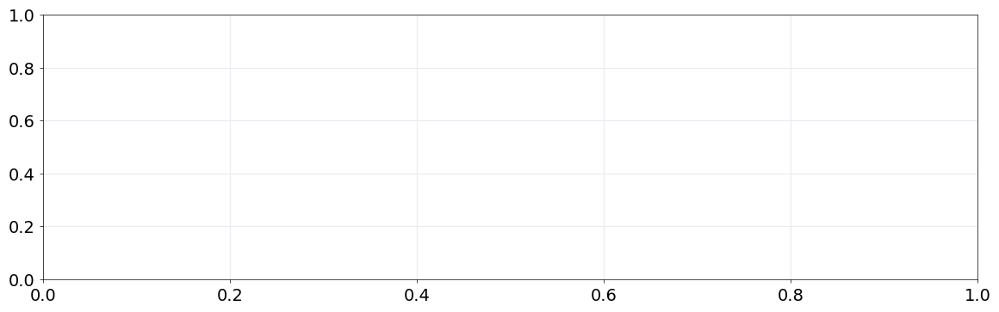

In [ ]:
from io import StringIO
from IPython.display import SVG, display as ipy_display
import matplotlib.pyplot as plt

for title, zoom in [('Полный горизонт', False), ('Zoom — тестовый период', True)]:
    fig, ax = plt.subplots(figsize=(14, 4))
    plot_forecast(train, val, test, xgb_preds, 'XGBoost',
                  lower=lower, upper=upper,
                  save_path=None, zoom=zoom)
    buf = StringIO()
    plt.savefig(buf, format='svg', bbox_inches='tight')
    plt.savefig(f'{SAVE_DIR}/forecast_{"zoom" if zoom else "full"}.svg',
                format='svg', bbox_inches='tight')
    plt.close()
    print(title)
    ipy_display(SVG(buf.getvalue()))

## XGBoost

In [ ]:
from io import StringIO
from IPython.display import SVG, display as ipy_display
import matplotlib.pyplot as plt
from evaluation.metrics import plot_forecast
from models.xgboost_model import get_confidence_interval

# Предсказания и доверительный интервал
xgb_preds = xgb_model.predict(X_te)

print('Обучение квантильных моделей...')
lower, upper = get_confidence_interval(X_tr, y_tr, X_vl, y_vl, X_te, save_dir=SAVE_DIR)

for title, zoom in [('Полный горизонт', False), ('Zoom — тестовый период', True)]:
    plot_forecast(train, val, test, xgb_preds, 'XGBoost',
                  lower=lower, upper=upper,
                  save_path=None, zoom=zoom)
    buf = StringIO()
    plt.savefig(buf, format='svg', bbox_inches='tight')
    plt.savefig(f'{SAVE_DIR}/forecast_{"zoom" if zoom else "full"}.svg',
                format='svg', bbox_inches='tight')
    plt.close()
    print(title)
    ipy_display(SVG(buf.getvalue()))


NameError: name 'xgb_model' is not defined

## §4.2 — Детекция пиковых нагрузок

Тест: 2019-03-17 00:00:00 → 2019-03-31 23:00:00


Predicting: 45it [00:00, ?it/s]

Q90 сдвиг: +1044 RPS  |  средний upper: 6355 RPS
Isolation Forest обучен на остатках STL
Порог: 7232 RPS | Пиков: 113 / 360


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

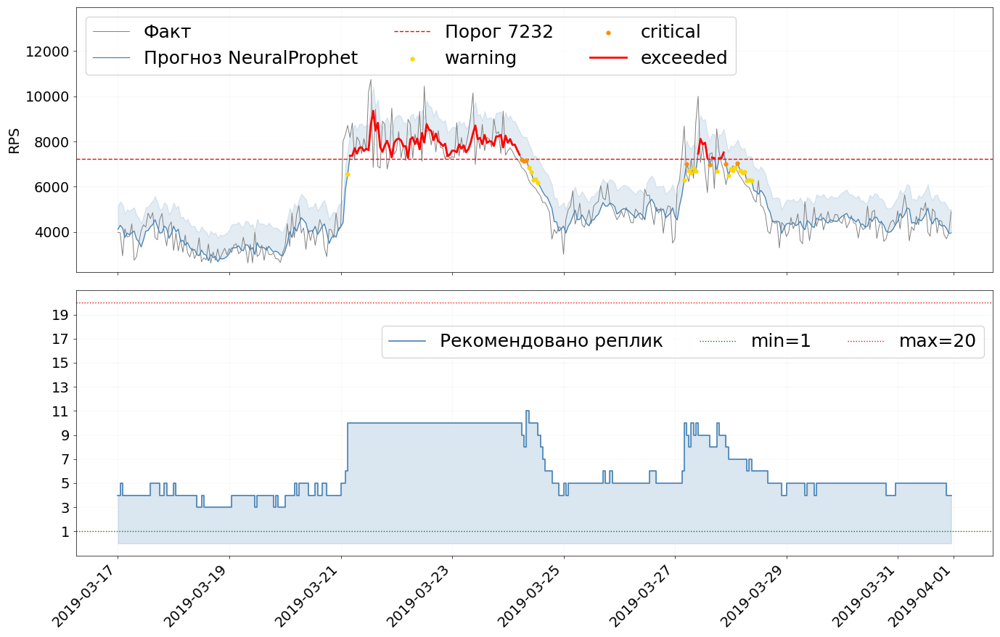

Среднее реплик : 6.2
Макс реплик    : 11
Мин реплик     : 3


In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from evaluation.peak_detection import PeakDetector
from models.neural_prophet_model import predict_neural_prophet
from preprocessing.feature_engineering import FeatureBuilder

# ── Даты тестовой выборки ─────────────────────────────────────────────────────
test_start = pd.Timestamp('2019-01-01') + pd.Timedelta(hours=len(train) + len(val))
ds_test    = pd.date_range(start=test_start, periods=len(test), freq='h')
print(f'Тест: {ds_test[0]} → {ds_test[-1]}')

np_preds    = comparator.predictions_.get('NeuralProphet')
y_te_pk     = pd.Series(test['y'].values[:len(np_preds)], index=ds_test[:len(np_preds)])
pred_series = pd.Series(np_preds[:len(y_te_pk)], index=y_te_pk.index)

# ── Q90 верхняя граница через конформное предсказание ────────────────────────
builder_q    = FeatureBuilder(exog_cols=_cfg.EXOG_COLS)
_, y_vl      = builder_q.get_X_y(val)

np_model     = comparator.models_['NeuralProphet']
preds_val_np = predict_neural_prophet(np_model, train_val_df=train, test_df=val)
n_vl         = min(len(preds_val_np), len(y_vl))
residuals_np = y_vl.values[:n_vl] - preds_val_np[:n_vl]

q_hi_np   = np.percentile(residuals_np, 90)
upper_arr  = np.clip(np_preds + q_hi_np, 0, None)
upper_ci   = pd.Series(upper_arr[:len(y_te_pk)], index=y_te_pk.index)
print(f'Q90 сдвиг: +{q_hi_np:.0f} RPS  |  средний upper: {upper_ci.mean():.0f} RPS')

# ── Детектор ──────────────────────────────────────────────────────────────────
rps_max  = float(train['y'].max())
detector = PeakDetector(
    method='percentile',   # ← было 'adaptive_percentile'
    percentile=95.0,
    target_rps_per_replica=rps_max / 10,
    min_replicas=1, max_replicas=20,
    warning_ratio=0.85, critical_ratio=0.95, k_safety=1.5,
)
detector.fit(train['y'])   # теперь считает по ВСЕЙ train, не по последним 24

_stats = globals().get('clean_stats', {})
if isinstance(_stats, dict) and 'residual' in _stats:
    detector.fit_anomaly_detector(_stats['residual'].dropna())
    print("Isolation Forest обучен на остатках STL")

# ── 1. Базовая детекция по прогнозу ───────────────────────────────────────────
events_df  = detector.detect_series(y_te_pk, pred_series)
summary_pk = detector.summary(events_df)
print(f'Порог: {summary_pk["threshold"]:.0f} RPS | Пиков: {summary_pk["peaks_detected"]} / {summary_pk["total_points"]}')

# ── 2. exceeded → реплики по Q90 ─────────────────────────────────────────────
recs       = events_df['recommended_replicas'].values.copy()
sevs       = events_df['severity'].values
upper_vals = upper_ci.values[:len(events_df)]

for i, sev in enumerate(sevs):
    if sev == 'exceeded':
        recs[i] = int(np.clip(
            np.ceil(upper_vals[i] / detector.target_rps),
            detector.min_replicas,
            detector.max_replicas,
        ))

# ── 3. exceeded-сегмент = max сегмента ───────────────────────────────────────
i = 0
while i < len(sevs):
    if sevs[i] == 'exceeded':
        j = i
        while j < len(sevs) and sevs[j] == 'exceeded':
            j += 1
        recs[i:j] = recs[i:j].max()
        i = j
    else:
        i += 1

# ── 4. Плавный спуск после exceeded ──────────────────────────────────────────
step_down = 1
for i in range(1, len(recs)):
    if recs[i] < recs[i - 1] - step_down:
        recs[i] = recs[i - 1] - step_down

events_df['recommended_replicas'] = recs

# ── Графики ───────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(14, 9), sharex=True)

ax1 = axes[0]
ax1.plot(events_df['timestamp'], events_df['rps'],
         color='gray', linewidth=0.7, label='Факт')
ax1.plot(events_df['timestamp'], events_df['predicted'],
         color='steelblue', linewidth=0.9, label='Прогноз NeuralProphet')
ax1.fill_between(events_df['timestamp'],
                 events_df['predicted'],
                 upper_vals[:len(events_df)],
                 alpha=0.15, color='steelblue')
ax1.axhline(summary_pk['threshold'], color='red', linestyle='--', linewidth=1.0,
            label=f'Порог {summary_pk["threshold"]:.0f}')

for sev, color in {'warning': 'gold', 'critical': 'darkorange'}.items():
    pts = events_df[events_df['severity'] == sev]
    if len(pts):
        ax1.scatter(pts['timestamp'], pts['predicted'],
                    color=color, s=12, zorder=5, label=sev)

exc = events_df[events_df['severity'] == 'exceeded'].copy()
if not exc.empty:
    full_idx   = pd.date_range(events_df['timestamp'].min(),
                               events_df['timestamp'].max(), freq='h')
    exc_series = exc.set_index('timestamp')['predicted'].reindex(full_idx)
    ax1.plot(full_idx, exc_series, color='red', linewidth=2.0, zorder=5, label='exceeded')

ymin, ymax = ax1.get_ylim()
ax1.set_ylim(ymin, ymax * 1.25)
ax1.set_ylabel('RPS')
ax1.legend(fontsize=18, loc='upper left', ncol=3)
ax1.grid(alpha=0.3)

ax2 = axes[1]
ax2.step(events_df['timestamp'], events_df['recommended_replicas'],
         color='steelblue', linewidth=1.2, where='post', label='Рекомендовано реплик')
ax2.fill_between(events_df['timestamp'], events_df['recommended_replicas'],
                 step='post', alpha=0.2, color='steelblue')
ax2.axhline(detector.min_replicas, color='green', linestyle=':',
            linewidth=1.0, label=f'min={detector.min_replicas}')
ax2.axhline(detector.max_replicas, color='red', linestyle=':',
            linewidth=1.0, label=f'max={detector.max_replicas}')
ax2.set_yticks(range(detector.min_replicas, detector.max_replicas + 1, 2))
ax2.legend(fontsize=18, loc='upper right', ncol=3, bbox_to_anchor=(1, 0.90))
ax2.grid(alpha=0.3)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/replicas_recommendation.png', dpi=150)
plt.savefig('peak_dettt.svg')
files.download('peak_dettt.svg')
plt.show()

print(f'Среднее реплик : {events_df["recommended_replicas"].mean():.1f}')
print(f'Макс реплик    : {events_df["recommended_replicas"].max()}')
print(f'Мин реплик     : {events_df["recommended_replicas"].min()}')


In [54]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from evaluation.peak_detection import PeakDetector
from models.neural_prophet_model import predict_neural_prophet
from preprocessing.feature_engineering import FeatureBuilder

# ── Параметры ─────────────────────────────────────────────────────────────────
WINDOW_H       = 168
PERCENTILE     = 95.0
MIN_REPLICAS   = 1
MAX_REPLICAS   = 20
WARNING_RATIO  = 0.85
CRITICAL_RATIO = 0.95

# ── Данные ────────────────────────────────────────────────────────────────────
test_start  = pd.Timestamp('2019-01-01') + pd.Timedelta(hours=len(train) + len(val))
ds_test     = pd.date_range(start=test_start, periods=len(test), freq='h')
np_preds    = comparator.predictions_.get('NeuralProphet')
y_te_pk     = pd.Series(test['y'].values[:len(np_preds)], index=ds_test[:len(np_preds)])
pred_series = pd.Series(np_preds[:len(y_te_pk)], index=y_te_pk.index)

# ── Q90 ───────────────────────────────────────────────────────────────────────
np_model     = comparator.models_['NeuralProphet']
preds_val_np = predict_neural_prophet(np_model, train_val_df=train, test_df=val)
builder_q    = FeatureBuilder()
_, y_vl      = builder_q.get_X_y(val)
n_vl         = min(len(preds_val_np), len(y_vl))
residuals_np = y_vl.values[:n_vl] - preds_val_np[:n_vl]
q_hi         = float(np.percentile(residuals_np, 90))
upper_arr    = np.clip(np_preds + q_hi, 0, None)
upper_ci     = pd.Series(upper_arr[:len(y_te_pk)], index=y_te_pk.index)
print(f'Q90 сдвиг: +{q_hi:.0f} RPS  |  средний upper: {upper_ci.mean():.0f} RPS')

# ── Детектор ──────────────────────────────────────────────────────────────────
rps_max            = float(train['y'].max())
target_rps_per_rep = rps_max / 10

detector = PeakDetector(
    method='percentile', percentile=PERCENTILE,
    window=WINDOW_H,
    target_rps_per_replica=target_rps_per_rep,
    min_replicas=MIN_REPLICAS, max_replicas=MAX_REPLICAS,
    warning_ratio=WARNING_RATIO, critical_ratio=CRITICAL_RATIO,
)
detector.fit(train['y'])
detector.fit_drift_detector(historical_rps=train['y'],
                             delta=0.002, min_obs=50,
                             cooldown_n=48, confirmation_n=5)
print(f'Начальный порог: {detector.threshold:.0f} RPS')

# ── Walk-forward ──────────────────────────────────────────────────────────────
all_rps       = pd.concat([train['y'], val['y']]).values
timestamps    = y_te_pk.index
actual_rps    = y_te_pk.values
predicted_rps = pred_series.values
upper_vals    = upper_ci.values

thresholds   = []
recommended  = []
severities   = []
drift_events = []

history = list(all_rps[-WINDOW_H:])
thr     = float(detector.threshold)

for i, (ts, rps, pred) in enumerate(zip(timestamps, actual_rps, predicted_rps)):

    detector._drift_detector.observe(y_true=rps, y_pred=detector._baseline_mean)
    signal = detector._drift_detector.check()
    if signal.triggered and len(history) >= WINDOW_H:
        recent = pd.Series(history[-WINDOW_H:]).dropna()
        thr    = float(np.nanpercentile(recent, PERCENTILE))
        detector._baseline_mean = float(np.mean(recent))
        detector._drift_detector.reset_after_retrain(
            np.abs(np.array(history[-WINDOW_H:]) - detector._baseline_mean)
        )
        drift_events.append(ts)
        print(f'  [дрейф] шаг {i} ({pd.Timestamp(ts).date()}): порог → {thr:.0f} RPS')

    thresholds.append(thr)

    if pred >= thr:                    sev = 'exceeded'
    elif pred >= thr * CRITICAL_RATIO: sev = 'critical'
    elif pred >= thr * WARNING_RATIO:  sev = 'warning'
    else:                              sev = 'ok'
    severities.append(sev)

    # Все уровни: реплики по Q90 верхней границе
    n_rep = int(np.clip(np.ceil(upper_vals[i] / target_rps_per_rep),
                        MIN_REPLICAS, MAX_REPLICAS))
    recommended.append(n_rep)
    history.append(rps)

results_df = pd.DataFrame({
    'timestamp':            timestamps,
    'rps':                  actual_rps,
    'predicted':            predicted_rps,
    'upper_ci':             upper_vals[:len(timestamps)],
    'threshold':            thresholds,
    'severity':             severities,
    'recommended_replicas': recommended,
})

results_df['recommended_replicas'] = (
    results_df['recommended_replicas']
    .rolling(window=12, min_periods=1).max().astype(int)
)

# ── Графики ───────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

ax1 = axes[0]
ax1.plot(results_df['timestamp'], results_df['rps'],
         color='gray', linewidth=0.7, label='Факт')
ax1.plot(results_df['timestamp'], results_df['predicted'],
         color='green', linewidth=0.9, label='Прогноз NeuralProphet')
ax1.fill_between(results_df['timestamp'],
                 results_df['predicted'], results_df['upper_ci'],
                 alpha=0.15, color='green', label='Q90 доверительный интервал')
ax1.plot(results_df['timestamp'], results_df['threshold'],
         color='red', linewidth=1.2, linestyle='--', label='Адаптивный порог')

for sev, color in {'warning': 'gold', 'critical': 'darkorange'}.items():
    pts = results_df[results_df['severity'] == sev]
    if len(pts):
        ax1.scatter(pts['timestamp'], pts['predicted'],
                    color=color, s=12, zorder=5, label=sev)

exc = results_df[results_df['severity'] == 'exceeded']
if not exc.empty:
    ax1.scatter(exc['timestamp'], exc['predicted'],
                color='red', s=12, zorder=5, label='exceeded')

for j, ts in enumerate(drift_events):
    ax1.axvline(pd.Timestamp(ts), color='purple', linestyle='-',
                linewidth=1.0, alpha=0.7,
                label='Пересчёт порога' if j == 0 else None)

ymin, ymax = ax1.get_ylim()
ax1.set_ylim(ymin, ymax * 1.15)
ax1.set_ylabel('RPS')
ax1.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02),
           ncol=4, frameon=False, fontsize=14)
ax1.grid(alpha=0.3)

ax2 = axes[1]
ax2.step(results_df['timestamp'], results_df['recommended_replicas'],
         color='steelblue', linewidth=1.2, where='post', label='Рекомендовано реплик')
ax2.fill_between(results_df['timestamp'], results_df['recommended_replicas'],
                 step='post', alpha=0.2, color='steelblue')
ax2.axhline(MIN_REPLICAS, color='green', linestyle=':', linewidth=1.0,
            label=f'min={MIN_REPLICAS}')
ax2.axhline(MAX_REPLICAS, color='red', linestyle=':', linewidth=1.0,
            label=f'max={MAX_REPLICAS}')
for j, ts in enumerate(drift_events):
    ax2.axvline(pd.Timestamp(ts), color='purple', linestyle='-',
                linewidth=1.0, alpha=0.7)
ax2.set_yticks(range(MIN_REPLICAS, MAX_REPLICAS + 1, 2))
ax2.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02),
           ncol=3, frameon=False, fontsize=14)
ax2.grid(alpha=0.3)

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('detected_peak.svg', dpi=150)
files.download('detected_peak.svg')
plt.show()

print(f'Порог: мин={min(thresholds):.0f}  макс={max(thresholds):.0f}  среднее={np.mean(thresholds):.0f} RPS')
print(f'Пересчётов порога: {len(drift_events)}')
print(f'Среднее реплик: {results_df["recommended_replicas"].mean():.1f}')
print(f'Макс реплик:    {results_df["recommended_replicas"].max()}')
print(f'Мин реплик:     {results_df["recommended_replicas"].min()}')

NameError: name 'train' is not defined

NameError: name 'events_df' is not defined

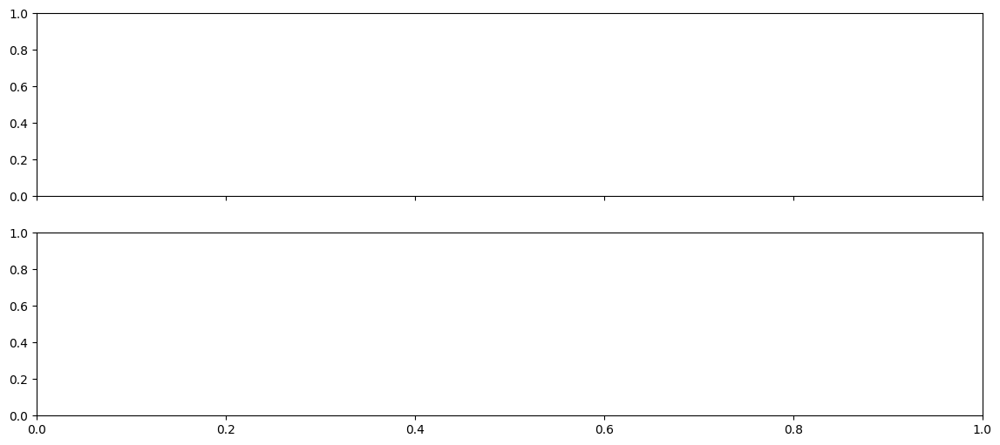

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

# Гистерезис: быстрый рост, медленное снижение

# recs = events_df['recommended_replicas'].values.copy()
# sevs = events_df['severity'].values
# for i in range(1, len(recs)):
#     if sevs[i] == 'exceeded':
#         recs[i] = max(recs[i], recs[i-1])
#     else:
#         recs[i] = max(recs[i], recs[i-1] - 1)
# events_df['recommended_replicas'] = recs

# График 1 — нагрузка и порог
ax1 = axes[0]
ax1.plot(events_df['timestamp'], events_df['rps'],       color='gray',      linewidth=0.7, label='Факт')
ax1.plot(events_df['timestamp'], events_df['predicted'], color='steelblue', linewidth=0.9, label='Прогноз')
ax1.axhline(summary_pk['threshold'], color='red', linestyle='--', linewidth=1.0,
            label=f'Порог {summary_pk["threshold"]:.0f}')

for sev, color in {'warning': 'gold', 'critical': 'darkorange'}.items():
    pts = events_df[events_df['severity'] == sev]
    if len(pts):
        ax1.scatter(pts['timestamp'], pts['predicted'], color=color, s=12, zorder=5, label=sev)

# exceeded — сплошная линия

exc = events_df[events_df['severity'] == 'exceeded'].copy()
if not exc.empty:
    # Разрываем линию между несмежными группами
    full_idx = pd.date_range(events_df['timestamp'].min(), events_df['timestamp'].max(), freq='h')
    exc_series = exc.set_index('timestamp')['predicted'].reindex(full_idx)
    ax1.plot(full_idx, exc_series, color='red', linewidth=2.0, zorder=5, label='exceeded')

ax1.set_ylabel('RPS'); ax1.legend(fontsize=14, loc='upper right', ncol=3); ax1.grid(alpha=0.3)

# График 2 — число реплик
ax2 = axes[1]
ax2.step(events_df['timestamp'], events_df['recommended_replicas'],
         color='steelblue', linewidth=1.2, where='post', label='Рекомендовано реплик')
ax2.fill_between(events_df['timestamp'], events_df['recommended_replicas'],
                 step='post', alpha=0.2, color='steelblue')
ax2.axhline(detector.min_replicas, color='green', linestyle=':', linewidth=1.0, label=f'min={detector.min_replicas}')
ax2.axhline(detector.max_replicas, color='red',   linestyle=':', linewidth=1.0, label=f'max={detector.max_replicas}')
# ax2.set_ylabel('Реплик'); ax2.set_xlabel('Время')
ax2.set_yticks(range(detector.min_replicas, detector.max_replicas + 1, 2))
ax2.legend(fontsize=14, loc='upper right', ncol=3, bbox_to_anchor=(1, 0.90)); ax2.grid(alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()

plt.savefig(f'{SAVE_DIR}/replicas_recommendation.png', dpi=150)


print(f'Среднее реплик : {events_df["recommended_replicas"].mean():.1f}')
print(f'Макс реплик    : {events_df["recommended_replicas"].max()}')
print(f'Мин реплик     : {events_df["recommended_replicas"].min()}')
plt.savefig('peak_dettt.svg')
# files.download('peak_dettt.svg')

## §4.3 — Walk-Forward валидация с адаптивным переобучением

Модель прогнозирует **точка за точкой**. При обнаружении концепт-дрейфа
(ADWIN или принудительно через `WF_N_FRESH` шагов) переобучается на всей
накопленной истории. Рядом идёт **фиксированная baseline-модель** для сравнения.

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import joblib
from evaluation.walk_forward import run_walk_forward
from retraining.scheduler import make_xgb_train_fn
from retraining.drift_detector import ADWINDriftDetector
from models.forecasters import predict_xgboost_wf
from preprocessing.feature_engineering import FeatureBuilder

initial_xgb = comparator.models_.get('XGBoost') or joblib.load(f'{SAVE_DIR}/xgboost.pkl')
builder_wf  = FeatureBuilder()
drift_det   = ADWINDriftDetector(n_fresh=WF_N_FRESH, confirmation_n=WF_CONFIRM_N)
train_fn_wf = make_xgb_train_fn(builder_wf, save_dir=SAVE_DIR)
test_wf     = test.iloc[:WF_TEST_LIMIT].reset_index(drop=True) if WF_TEST_LIMIT else test.reset_index(drop=True)

print(f'Walk-forward: {len(test_wf)} шагов, n_fresh={WF_N_FRESH}, confirm={WF_CONFIRM_N}\n')

wf_res = run_walk_forward(
    train=train, val=val, test=test_wf,
    initial_model=initial_xgb,
    predict_fn=predict_xgboost_wf,
    train_fn=train_fn_wf,
    builder=builder_wf,
    drift_detector=drift_det,
    save_dir=SAVE_DIR,
    verbose=True,
)

Walk-forward: 248 шагов, n_fresh=200, confirm=10

Baseline MAE: 1511.107

  шаг 0/248, MAE адапт.=606.26, MAE baseline=606.26
  шаг 50/248, MAE адапт.=1055.85, MAE baseline=1055.85
  шаг 100/248, MAE адапт.=182.26, MAE baseline=182.26
  шаг 150/248, MAE адапт.=173.89, MAE baseline=173.89
  XGBoost Optuna TPE: 30 trials...


  0%|          | 0/30 [00:00<?, ?it/s]

  XGBoost Optuna завершён: RMSE=338.3336  params={'max_depth': 4, 'learning_rate': 0.08404186220701813, 'subsample': 0.7483752788945377, 'colsample_bytree': 0.9160011108247927, 'min_child_weight': 7, 'reg_alpha': 0.1656078720226557, 'reg_lambda': 1.6872039983749283}
  [retrain] шаг 199: MAE 399.48 → 268.30 (причина: n_fresh, интервал: 199 шагов)
  шаг 200/248, MAE адапт.=102.81, MAE baseline=204.06

--- Итог walk-forward ---
  MAE адаптивная:   440.581
  MAE фиксированная:443.67
  Улучшение:        0.7%
  Переобучений:     1


In [ ]:
import numpy as np

res_df     = wf_res['results_df']
base_df    = wf_res['baseline_df']
summary_wf = wf_res['summary']
retrains   = summary_wf['retrain_timestamps']

print('=' * 50)
print('ИТОГ WALK-FORWARD')
print('=' * 50)
print(f'MAE адаптивная   : {summary_wf["mae_adaptive"]}')
print(f'MAE фиксированная: {summary_wf["mae_baseline"]}')
print(f'Улучшение        : {summary_wf["improvement_pct"]}%')
print(f'Переобучений     : {summary_wf["n_retrains"]}')
if summary_wf['retrain_intervals']:
    iv = summary_wf['retrain_intervals']
    print(f'Интервалы (шаги) : min={min(iv)}, max={max(iv)}, mean={np.mean(iv):.0f}')

ИТОГ WALK-FORWARD
MAE адаптивная   : 1684.828
MAE фиксированная: 1686.895
Улучшение        : 0.1%
Переобучений     : 1
Интервалы (шаги) : min=199, max=199, mean=199


Событий переобучения: 2


,timestamp,reason,n_observations,baseline_mae_before,rolling_mae_before,new_baseline_mae,train_size,duration_s
0,2026-05-30T07:19:39Z,n_fresh,200,992.536350,2345.471799,101.104855,2000,7.39
1,2026-05-30T07:20:20Z,n_fresh,150,599.276456,2306.632510,321.017441,850,9.88


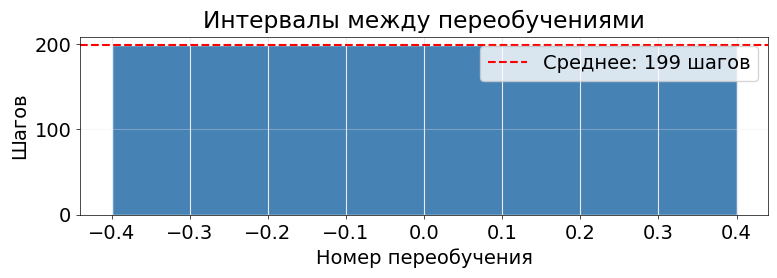

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Лог переобучений
log_path = f'{SAVE_DIR}/walk_forward_log.csv'
if os.path.exists(log_path):
    log_df = pd.read_csv(log_path)
    print(f'Событий переобучения: {len(log_df)}')
    display(log_df)

# Интервалы между переобучениями
if summary_wf['retrain_intervals']:
    iv = summary_wf['retrain_intervals']
    fig, ax = plt.subplots(figsize=(8, 3))
    ax.bar(range(len(iv)), iv, color='steelblue', edgecolor='white')
    ax.axhline(np.mean(iv), color='red', linestyle='--', label=f'Среднее: {np.mean(iv):.0f} шагов')
    ax.set_title('Интервалы между переобучениями')
    ax.set_xlabel('Номер переобучения'); ax.set_ylabel('Шагов')
    ax.legend(); ax.grid(alpha=0.3, axis='y')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/retrain_intervals.png', dpi=150)


## §4.3 Адаптивное переобучение на синтетическом дрейфе

### Тест с ошибкой изначальной

Train: 600ч  Val: 100ч  Test: 200ч
Дрейф:     2019-01-21 – 2019-01-29
Тест с:    2019-01-30


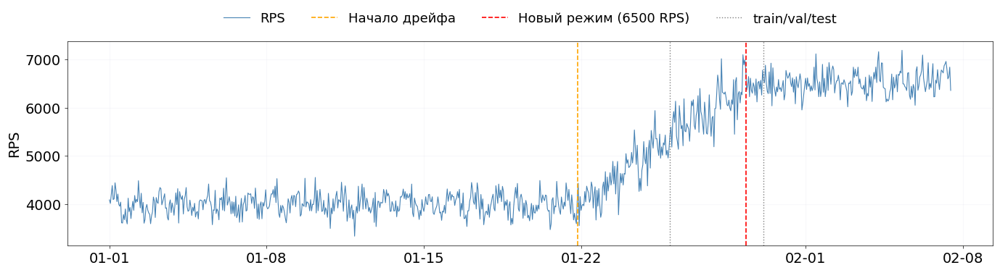

In [ ]:
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from preprocessing.feature_engineering import FeatureBuilder, split_train_val_test

SAVE_DIR = '/content/results'
os.makedirs(SAVE_DIR, exist_ok=True)

# ── Синтетический ряд ─────────────────────────────────────────────────────────
np.random.seed(42)
N           = 900
DRIFT_START = 500
DRIFT_END   = 680

hours = pd.date_range('2019-01-01', periods=N, freq='h')
rps   = np.zeros(N)

for i in range(N):
    seasonal = 400 * np.sin(2 * np.pi * hours[i].hour / 24) * 0.4
    if i < DRIFT_START:
        mean, noise = 4000, np.random.normal(0, 180)
    elif i < DRIFT_END:
        progress = (i - DRIFT_START) / (DRIFT_END - DRIFT_START)
        mean, noise = 4000 + progress * 2500, np.random.normal(0, 280)
    else:
        mean, noise = 6500, np.random.normal(0, 220)
    rps[i] = max(500, mean + seasonal + noise)

df_synth = pd.DataFrame({'ds': hours, 'y': rps})
tr_s, vl_s, te_s = split_train_val_test(df_synth, test_hours=200, val_hours=100)

print(f'Train: {len(tr_s)}ч  Val: {len(vl_s)}ч  Test: {len(te_s)}ч')
print(f'Дрейф:     {hours[DRIFT_START].date()} – {hours[DRIFT_END].date()}')
print(f'Тест с:    {te_s["ds"].iloc[0].date()}')

# ── График ────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 4))

ax.plot(df_synth['ds'], df_synth['y'],
        color='steelblue', linewidth=0.8, label='RPS')

ax.axvline(hours[DRIFT_START], color='orange', linestyle='--',
           linewidth=1.2, label='Начало дрейфа')
ax.axvline(hours[DRIFT_END],   color='red',    linestyle='--',
           linewidth=1.2, label='Новый режим (6500 RPS)')
ax.axvline(tr_s['ds'].iloc[-1], color='gray', linestyle=':',
           linewidth=1.0, label='train/val/test')
ax.axvline(vl_s['ds'].iloc[-1], color='gray', linestyle=':',
           linewidth=1.0)

ax.set_ylabel('RPS')
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02),
          ncol=4, frameon=False, fontsize=13)
ax.grid(alpha=0.3)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig('retrain.svg', dpi=150)
# files.download('retrain.svg')
plt.show()


In [ ]:
# ── Ячейка 2: модель + walk-forward ──────────────────────────────────────────
from retraining.scheduler import make_xgb_train_fn
from retraining.drift_detector import ADWINDriftDetector
from models.forecasters import predict_xgboost_wf
from models.xgboost_model import train_xgboost
from evaluation.walk_forward import run_walk_forward

builder_s  = FeatureBuilder()
X_tr, y_tr = builder_s.get_X_y(tr_s)
X_vl, y_vl = builder_s.get_X_y(vl_s)
init_model = train_xgboost(X_tr, y_tr, X_vl, y_vl)

drift_s = ADWINDriftDetector(
    delta=0.002,
    n_fresh=150,
    confirmation_n=5,
    min_obs=30,
    cooldown_n=20,
)
train_fn = make_xgb_train_fn(FeatureBuilder(), save_dir=SAVE_DIR)

wf = run_walk_forward(
    train=tr_s, val=vl_s, test=te_s,
    initial_model=init_model,
    predict_fn=predict_xgboost_wf,
    train_fn=train_fn,
    builder=FeatureBuilder(),
    drift_detector=drift_s,
    save_dir=SAVE_DIR,
    verbose=True,
)

res_df   = wf['results_df']
base_df  = wf['baseline_df']
retrains = wf['summary']['retrain_timestamps']
print(f'Ретрейнов: {len(retrains)}')


  XGBoost обучен: 1 деревьев (early stopping @ 20)
Baseline MAE: 595.832

  шаг 0/200, MAE адапт.=2368.40, MAE baseline=2368.40
  шаг 50/200, MAE адапт.=2249.47, MAE baseline=2249.47
  шаг 100/200, MAE адапт.=2637.57, MAE baseline=2637.57
  XGBoost Optuna TPE: 30 trials...


  0%|          | 0/30 [00:00<?, ?it/s]

  XGBoost Optuna завершён: RMSE=354.3130  params={'max_depth': 5, 'learning_rate': 0.04176952055910645, 'subsample': 0.6022623309895719, 'colsample_bytree': 0.8800953188604057, 'min_child_weight': 6, 'reg_alpha': 0.2283160921802739, 'reg_lambda': 1.395025587711993}
  [retrain] шаг 149: MAE 2328.07 → 293.20 (причина: n_fresh, интервал: 149 шагов)
  шаг 150/200, MAE адапт.=42.24, MAE baseline=2287.75

--- Итог walk-forward ---
  MAE адаптивная:   1808.312
  MAE фиксированная:2349.238
  Улучшение:        23.0%
  Переобучений:     1
Ретрейнов: 1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

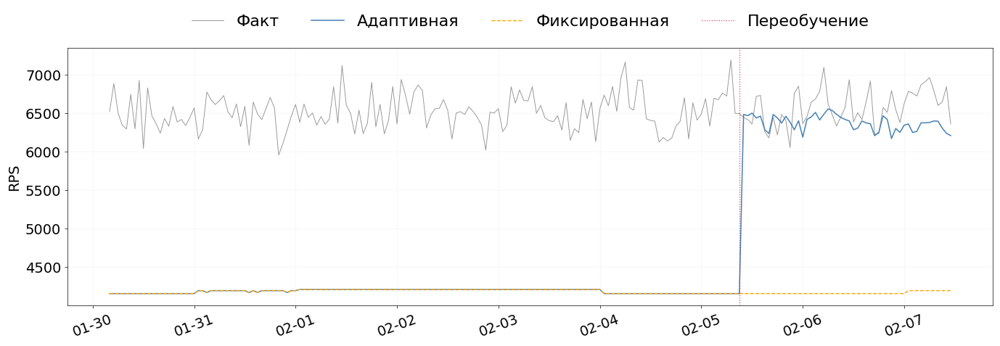


MAE адаптивная:   1808.3 RPS
MAE фиксированная:2349.2 RPS
Улучшение:        23.0%


In [ ]:
fig, ax = plt.subplots(figsize=(14, 5))

ax.plot(res_df['timestamp'],  res_df['y_true'],            color='gray',      linewidth=0.7, alpha=0.8, label='Факт')
ax.plot(res_df['timestamp'],  res_df['y_pred'],            color='steelblue', linewidth=1.1, label='Адаптивная')
ax.plot(base_df['timestamp'], base_df['y_pred_baseline'],  color='orange',    linewidth=1.0,
        linestyle='--', label='Фиксированная')

for i, ts in enumerate(retrains):
    ax.axvline(ts, color='crimson', linestyle=':', linewidth=0.9, alpha=0.8,
               label='Переобучение' if i == 0 else None)

ax.set_ylabel('RPS')
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=4, frameon=False, fontsize=16)
ax.grid(alpha=0.3)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig('plot_model_comparison.svg', dpi=150)
# files.download('plot_model_comparison.svg')
plt.show()

# ── Метрики ───────────────────────────────────────────────────────────────────
mae_adapt = res_df['mae'].mean()
mae_fixed = base_df['mae_baseline'].mean()
print(f'\nMAE адаптивная:   {mae_adapt:.1f} RPS')
print(f'MAE фиксированная:{mae_fixed:.1f} RPS')
print(f'Улучшение:        {(1 - mae_adapt/mae_fixed)*100:.1f}%')

MAE адаптивная  (весь тест):       1808.3 RPS
MAE фиксированная (весь тест):     2349.2 RPS
Улучшение (весь тест):             23.0%

MAE адаптивная  (после ретрейна):  290.1 RPS
MAE фиксированная (после ретрейна):2411.3 RPS
Улучшение (после ретрейна):        88.0%


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

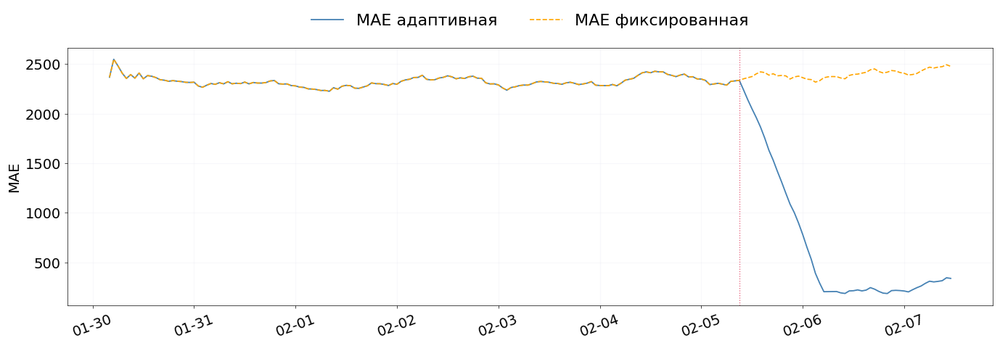

In [ ]:
# ── Метрики улучшения ─────────────────────────────────────────────────────────
mae_adapt  = res_df['mae'].mean()
mae_fixed  = base_df['mae_baseline'].mean()

# Только после последнего ретрейна (стабильная адаптация)
if retrains:
    last_retrain = pd.Timestamp(retrains[-1])
    mae_adapt_stable = res_df.loc[res_df['timestamp'] >= last_retrain, 'mae'].mean()
    mae_fixed_stable = base_df.loc[base_df['timestamp'] >= last_retrain, 'mae_baseline'].mean()
else:
    mae_adapt_stable = mae_adapt
    mae_fixed_stable = mae_fixed

improvement_total  = (1 - mae_adapt  / mae_fixed)  * 100
improvement_stable = (1 - mae_adapt_stable / mae_fixed_stable) * 100

print(f'MAE адаптивная  (весь тест):       {mae_adapt:.1f} RPS')
print(f'MAE фиксированная (весь тест):     {mae_fixed:.1f} RPS')
print(f'Улучшение (весь тест):             {improvement_total:.1f}%')
print()
print(f'MAE адаптивная  (после ретрейна):  {mae_adapt_stable:.1f} RPS')
print(f'MAE фиксированная (после ретрейна):{mae_fixed_stable:.1f} RPS')
print(f'Улучшение (после ретрейна):        {improvement_stable:.1f}%')

fig, ax = plt.subplots(figsize=(14, 5))

w = min(24, max(1, len(res_df) // 10))
roll_a = res_df['mae'].rolling(w, min_periods=1).mean()
roll_b = base_df['mae_baseline'].rolling(w, min_periods=1).mean()

ax.plot(res_df['timestamp'], roll_a, color='steelblue', linewidth=1.3,
        label=f'MAE адаптивная')
ax.plot(base_df['timestamp'], roll_b, color='orange', linewidth=1.2,
        linestyle='--', label=f'MAE фиксированная')

for ts in retrains:
    ax.axvline(ts, color='crimson', linestyle=':', linewidth=0.9, alpha=0.7)

ax.set_ylabel('MAE')
# ax.set_title('Сравнение ошибок моделей')
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=4, frameon=False, fontsize=16)
ax.grid(alpha=0.3)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=20)

plt.tight_layout()
plt.savefig('plot_mae_comparison.svg', dpi=150)
files.download('plot_mae_comparison.svg')

## **Тест с изменением данных**

In [ ]:
# ── ЯЧЕЙКА 1: импорты ─────────────────────────────────────────────────────────
import os, sys
REPO_DIR = '/content/Dyplom'
if REPO_DIR not in sys.path: sys.path.insert(0, REPO_DIR)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from preprocessing.feature_engineering import FeatureBuilder, split_train_val_test
from evaluation.walk_forward import run_walk_forward
from retraining.drift_detector import ADWINDriftDetector
from models.forecasters import train_xgboost, predict_xgboost, predict_xgboost_wf

SAVE_DIR = '/content/results'
os.makedirs(SAVE_DIR, exist_ok=True)

# ── ЯЧЕЙКА 2: синтетический ряд — дрейф внутри теста ─────────────────────────
np.random.seed(42)
N           = 900
DRIFT_START = 720   # шаг 20 теста
DRIFT_END   = 760   # шаг 60 теста — переход за 40ч

hours = pd.date_range('2019-01-01', periods=N, freq='h')
rps   = np.zeros(N)

for i in range(N):
    seasonal = 400 * np.sin(2 * np.pi * hours[i].hour / 24) * 0.4
    if i < DRIFT_START:
        mean, noise = 4000, np.random.normal(0, 180)
    elif i < DRIFT_END:
        progress = (i - DRIFT_START) / (DRIFT_END - DRIFT_START)
        mean     = 4000 + progress * 2500
        noise    = np.random.normal(0, 280)
    else:
        mean, noise = 6500, np.random.normal(0, 220)
    rps[i] = max(500, mean + seasonal + noise)

df_synth = pd.DataFrame({'ds': hours, 'y': rps})
tr_s, vl_s, te_s = split_train_val_test(df_synth, test_hours=200, val_hours=100)

print(f'Train: {len(tr_s)}ч  Val: {len(vl_s)}ч  Test: {len(te_s)}ч')
print(f'Дрейф: шаги {DRIFT_START-700}–{DRIFT_END-700} теста '
      f'({hours[DRIFT_START].date()} → {hours[DRIFT_END].date()})')

# ── ЯЧЕЙКА 3: базовая модель XGBoost (обучается ДО дрейфа) ───────────────────
builder_s  = FeatureBuilder()
X_tr, y_tr = builder_s.get_X_y(tr_s)
X_vl, y_vl = builder_s.get_X_y(vl_s)
init_model = train_xgboost(X_tr, y_tr, X_vl, y_vl)
print(f'XGBoost обучен на {len(X_tr)} точках (без дрейфа)')

# ── ЯЧЕЙКА 4: walk-forward с XGBoost + динамический порог ────────────────────
RECENT_WINDOW   = 150
MIN_NEW_REGIME  = 50   # минимум точек нового режима для обучения

class FeatureBuilderShortLag(FeatureBuilder):
    LAG_HOURS  = [1, 24]
    _LAG_NAMES = ["rps_lag_1h", "rps_lag_24h"]

def train_fn_recent_xgb(history_df: pd.DataFrame):
    history_df = history_df.sort_values('ds').reset_index(drop=True)

    builder_rt   = FeatureBuilderShortLag()
    X_all, y_all = builder_rt.get_X_y(history_df)

    # Динамический порог: медиана последних 30 точек × 0.8
    # Если новый режим устоялся → медиана ~6500 → порог ~5200
    # Если дрейф только начался → медиана ~4500 → порог ~3600 → берём обычное окно
    recent_median   = float(y_all.iloc[-30:].median()) if len(y_all) >= 30 else float(y_all.median())
    dynamic_thresh  = recent_median * 0.8
    new_regime_mask = y_all >= dynamic_thresh
    n_new           = int(new_regime_mask.sum())

    if n_new >= MIN_NEW_REGIME:
        # Достаточно данных нового режима — обучаем только на них
        X_sel = X_all[new_regime_mask].reset_index(drop=True)
        y_sel = y_all[new_regime_mask].reset_index(drop=True)
        print(f'    [retrain] режим: новый ({n_new} точек, порог={dynamic_thresh:.0f})')
    else:
        # Новый режим ещё не устоялся — берём последние RECENT_WINDOW точек
        X_sel = X_all.iloc[-RECENT_WINDOW:].reset_index(drop=True)
        y_sel = y_all.iloc[-RECENT_WINDOW:].reset_index(drop=True)
        print(f'    [retrain] режим: смешанный ({n_new} новых < {MIN_NEW_REGIME}, окно={RECENT_WINDOW})')

    n_val        = max(30, int(len(X_sel) * 0.15))
    X_tr, y_tr   = X_sel.iloc[:-n_val], y_sel.iloc[:-n_val]
    X_vl, y_vl   = X_sel.iloc[-n_val:], y_sel.iloc[-n_val:]

    model           = train_xgboost(X_tr, y_tr, X_vl, y_vl)
    baseline_errors = np.abs(y_vl.values - predict_xgboost(model, X_vl))
    return model, predict_xgboost_wf, baseline_errors

drift_s = ADWINDriftDetector(delta=0.002, n_fresh=0, confirmation_n=1, cooldown_n=30)

wf = run_walk_forward(
    train=tr_s, val=vl_s, test=te_s,
    initial_model=init_model,
    predict_fn=predict_xgboost_wf,
    train_fn=train_fn_recent_xgb,
    builder=FeatureBuilder(),
    drift_detector=drift_s,
    save_dir=SAVE_DIR,
    verbose=True,
)

res_df    = wf['results_df']
base_df   = wf['baseline_df']
summary_s = wf['summary']
retrains  = summary_s['retrain_timestamps']

print(f'\nРетрейнов: {len(retrains)}')
for rt in retrains: print(f'  {rt}')
print(f'MAE адаптивная:    {summary_s["mae_adaptive"]:.1f}')
print(f'MAE фиксированная: {summary_s["mae_baseline"]:.1f}')
print(f'Улучшение:         {summary_s["improvement_pct"]:.1f}%')

Train: 600ч  Val: 100ч  Test: 200ч
Дрейф: шаги 20–60 теста (2019-01-31 → 2019-02-01)
  XGBoost обучен: 1 деревьев (early stopping @ 20)
XGBoost обучен на 432 точках (без дрейфа)
Baseline MAE: 169.629

  шаг 0/200, MAE адапт.=42.80, MAE baseline=42.80
  шаг 50/200, MAE адапт.=1770.08, MAE baseline=1770.08
    [retrain] режим: новый (59 точек, порог=4402)
  XGBoost обучен: 45 деревьев (early stopping @ 20)
  [retrain] шаг 59: MAE 872.04 → 968.71 (причина: adwin, интервал: 59 шагов)
    [retrain] режим: новый (53 точек, порог=5214)
  XGBoost обучен: 128 деревьев (early stopping @ 20)
  [retrain] шаг 93: MAE 1985.92 → 169.09 (причина: adwin, интервал: 34 шагов)
  шаг 100/200, MAE адапт.=349.93, MAE baseline=2840.30
  шаг 150/200, MAE адапт.=65.50, MAE baseline=2438.11

--- Итог walk-forward ---
  MAE адаптивная:   708.77
  MAE фиксированная:2047.682
  Улучшение:        65.4%
  Переобучений:     2

Ретрейнов: 2
  2019-02-01 15:00:00
  2019-02-03 01:00:00
MAE адаптивная:    708.8
MAE фиксиро

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

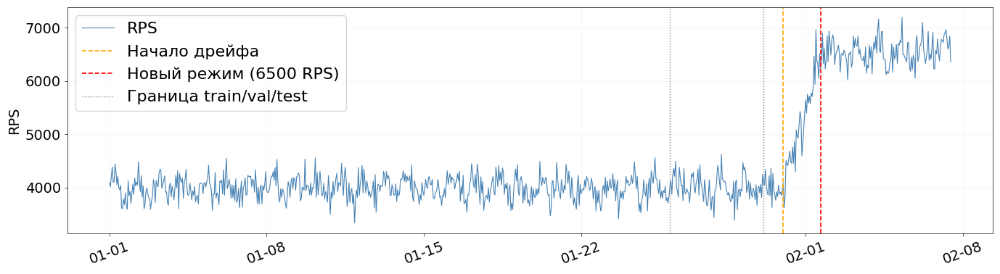

In [ ]:
# ── ЯЧЕЙКА 5: График 1 — синтетический ряд целиком ───────────────────────────
fig, ax = plt.subplots(figsize=(14, 4))

ax.plot(df_synth['ds'], df_synth['y'], color='steelblue', linewidth=0.8, label='RPS')
ax.axvline(hours[DRIFT_START], color='orange', linestyle='--', linewidth=1.2, label='Начало дрейфа')
ax.axvline(hours[DRIFT_END],   color='red',    linestyle='--', linewidth=1.2, label='Новый режим (6500 RPS)')
ax.axvline(tr_s['ds'].iloc[-1], color='gray', linestyle=':', linewidth=1.0, label='Граница train/val/test')
ax.axvline(vl_s['ds'].iloc[-1], color='gray', linestyle=':', linewidth=1.0)

ax.set_ylabel('RPS')
# ax.set_title('Синтетический ряд с концепт-дрейфом внутри тестового периода')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=20)
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('synth_series.svg')
files.download('synth_series.svg')

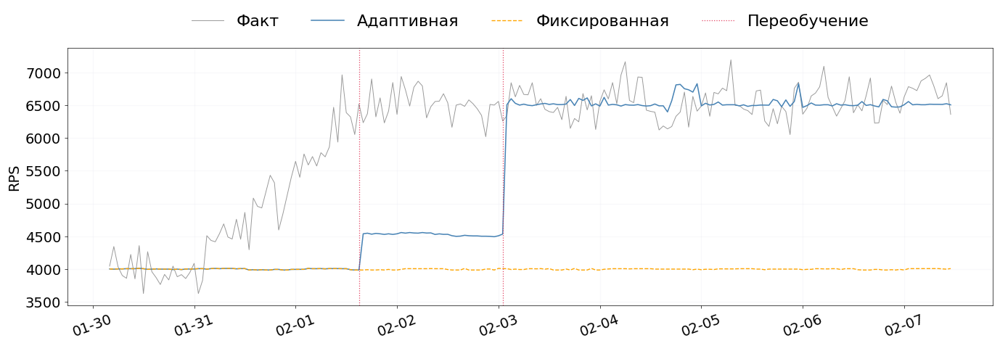

In [ ]:
# ── ЯЧЕЙКА 6: График 2 — прогноз vs факт на тесте ────────────────────────────
fig, ax = plt.subplots(figsize=(14, 5))

ax.plot(res_df['timestamp'], res_df['y_true'],            color='gray',      linewidth=0.7, alpha=0.8, label='Факт')
ax.plot(res_df['timestamp'], res_df['y_pred'],            color='steelblue', linewidth=1.1, label='Адаптивная')
ax.plot(base_df['timestamp'], base_df['y_pred_baseline'], color='orange',    linewidth=1.0,
        linestyle='--', label='Фиксированная')

for i, ts in enumerate(retrains):
    ax.axvline(ts, color='crimson', linestyle=':', linewidth=0.9, alpha=0.8,
               label='Переобучение' if i == 0 else None)

ax.set_ylabel('RPS')
# ax.set_title('Сравнение прогнозов моделей на тестовом периоде')
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=4, frameon=False, fontsize=16)
ax.grid(alpha=0.3)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig('plot_model_comparison.svg')
# files.download('plot_model_comparison.svg')
plt.show()

MAE адаптивная  (весь тест):       708.8 RPS
MAE фиксированная (весь тест):     2047.7 RPS
Улучшение (весь тест):             65.4%

MAE адаптивная  (после ретрейна):  220.9 RPS
MAE фиксированная (после ретрейна):2559.0 RPS
Улучшение (после ретрейна):        91.4%


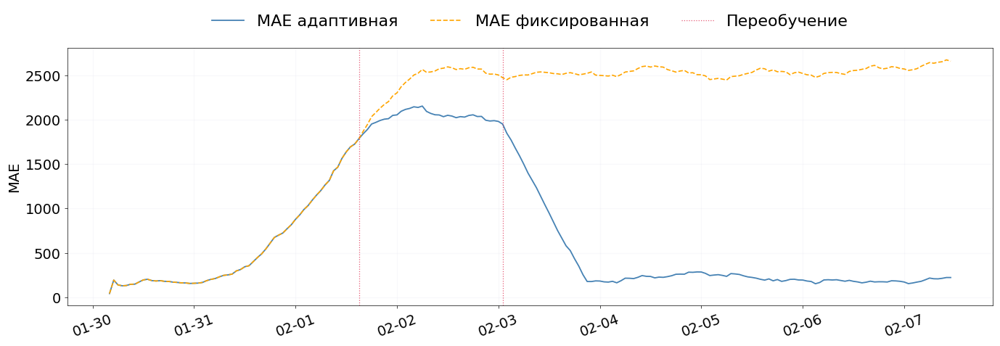

In [ ]:
# ── ЯЧЕЙКА 7: График 3 — скользящая MAE ──────────────────────────────────────
# ── Метрики улучшения ─────────────────────────────────────────────────────────
mae_adapt  = res_df['mae'].mean()
mae_fixed  = base_df['mae_baseline'].mean()

# Только после последнего ретрейна (стабильная адаптация)
if retrains:
    last_retrain = pd.Timestamp(retrains[-1])
    mae_adapt_stable = res_df.loc[res_df['timestamp'] >= last_retrain, 'mae'].mean()
    mae_fixed_stable = base_df.loc[base_df['timestamp'] >= last_retrain, 'mae_baseline'].mean()
else:
    mae_adapt_stable = mae_adapt
    mae_fixed_stable = mae_fixed

improvement_total  = (1 - mae_adapt  / mae_fixed)  * 100
improvement_stable = (1 - mae_adapt_stable / mae_fixed_stable) * 100

print(f'MAE адаптивная  (весь тест):       {mae_adapt:.1f} RPS')
print(f'MAE фиксированная (весь тест):     {mae_fixed:.1f} RPS')
print(f'Улучшение (весь тест):             {improvement_total:.1f}%')
print()
print(f'MAE адаптивная  (после ретрейна):  {mae_adapt_stable:.1f} RPS')
print(f'MAE фиксированная (после ретрейна):{mae_fixed_stable:.1f} RPS')
print(f'Улучшение (после ретрейна):        {improvement_stable:.1f}%')

fig, ax = plt.subplots(figsize=(14, 5))

w = 20
roll_a = res_df['mae'].rolling(w, min_periods=1).mean()
roll_b = base_df['mae_baseline'].rolling(w, min_periods=1).mean()

ax.plot(res_df['timestamp'],  roll_a, color='steelblue', linewidth=1.3,
        label=f'MAE адаптивная')
ax.plot(base_df['timestamp'], roll_b, color='orange',    linewidth=1.2,
        linestyle='--', label=f'MAE фиксированная')

for i, ts in enumerate(retrains):
    ax.axvline(ts, color='crimson', linestyle=':', linewidth=0.9, alpha=0.7,
               label='Переобучение' if i == 0 else None)

ax.set_ylabel('MAE')
# ax.set_title('Сравнение ошибок моделей (скользящее среднее)')
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=4, frameon=False, fontsize=16)
ax.grid(alpha=0.3)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig('plot_mae_comparison.svg', dpi=150)
# files.download('plot_mae_comparison.svg')

plt.show()

## ОРЕОЛ, СРАВНЕНИЕ ПРИЗНАКОВ VS БЕЗ ПРИЗНАКОВ

HALO_BEFORE=3, HALO_AFTER=2
Train: 2019-01-01 → 2019-12-31
Val  : 2020-01-01   → 2020-04-30
Test : 2020-05-01  → 2020-12-31


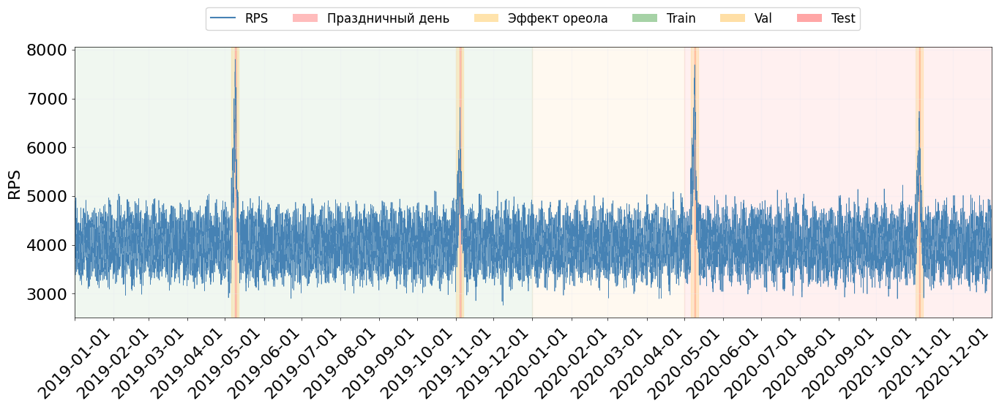

In [ ]:
import os, sys
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

sys.path.insert(0, '/content/peak_predictor')
os.chdir('/content/peak_predictor')

import config
from preprocessing.data_cleaning import TimeSeriesCleaner

np.random.seed(42)

HALO_BEFORE = config.HALO_BEFORE   # 3
HALO_AFTER  = config.HALO_AFTER    # 2
print(f"HALO_BEFORE={HALO_BEFORE}, HALO_AFTER={HALO_AFTER}")

# Только 2 праздника для визуализации и признаков
DEMO_HOLS = {}
for year in [2019, 2020]:
    DEMO_HOLS[datetime.date(year, 5,  9)] = ('День Победы',   1.7)
    DEMO_HOLS[datetime.date(year, 11, 4)] = ('День единства',  1.1)

demo_set = set(DEMO_HOLS.keys())

def holiday_weight(date):
    return DEMO_HOLS.get(date, ('', 0.0))[1]

# Генерация датасета (2 года)
dates = pd.date_range('2019-01-01', '2020-12-31 23:00', freq='h')
rps   = []

for dt in dates:
    base = (4000
            + 500 * np.sin(2 * np.pi * dt.hour / 24)
            + 150 * np.sin(2 * np.pi * dt.dayofweek / 7))
    halo = 0.0
    for i in range(1, HALO_BEFORE + 1):
        d = (dt + pd.Timedelta(days=i)).date()
        if d in demo_set:
            halo += (HALO_BEFORE + 1 - i) * 400 * holiday_weight(d)
    if dt.date() in demo_set:
        halo += 1800 * holiday_weight(dt.date())
    for i in range(1, HALO_AFTER + 1):
        d = (dt - pd.Timedelta(days=i)).date()
        if d in demo_set:
            halo += (HALO_AFTER + 1 - i) * 300 * holiday_weight(d)
    rps.append(max(500, base + halo + np.random.normal(0, 180)))

df_halo = pd.DataFrame({'ds': dates, 'y': rps})

train_h = df_halo[df_halo['ds'] < '2020-01-01'].reset_index(drop=True)
val_h   = df_halo[(df_halo['ds'] >= '2020-01-01') &
                  (df_halo['ds'] <  '2020-05-01')].reset_index(drop=True)
test_h  = df_halo[df_halo['ds'] >= '2020-05-01'].reset_index(drop=True)

print(f"Train: {train_h['ds'].min().date()} → {train_h['ds'].max().date()}")
print(f"Val  : {val_h['ds'].min().date()}   → {val_h['ds'].max().date()}")
print(f"Test : {test_h['ds'].min().date()}  → {test_h['ds'].max().date()}")

# Визуализация датасета
fig, ax = plt.subplots(figsize=(14, 6))
ax.axvspan(train_h['ds'].min(), train_h['ds'].max(), alpha=0.06, color='green',  zorder=0)
ax.axvspan(val_h['ds'].min(),   val_h['ds'].max(),   alpha=0.06, color='orange', zorder=0)
ax.axvspan(test_h['ds'].min(),  test_h['ds'].max(),  alpha=0.06, color='red',    zorder=0)

for date, (name, _) in sorted(DEMO_HOLS.items()):
    ts = pd.Timestamp(date)
    ax.axvspan(max(ts - pd.Timedelta(days=HALO_BEFORE), df_halo['ds'].min()),
               ts, alpha=0.35, color='#FFD580', zorder=1)
    ax.axvspan(ts, ts + pd.Timedelta(days=1), alpha=0.50, color='#FF9999', zorder=1)
    ax.axvspan(ts + pd.Timedelta(days=1),
               min(ts + pd.Timedelta(days=1 + HALO_AFTER), df_halo['ds'].max()),
               alpha=0.35, color='#FFD580', zorder=1)

ax.plot(df_halo['ds'], df_halo['y'], color='steelblue', linewidth=0.5, zorder=2)
ax.legend(
    handles=[
        mlines.Line2D([], [], color='steelblue', linewidth=1.5, label='RPS'),
        mpatches.Patch(facecolor='#FF9999', alpha=0.65, label='Праздничный день'),
        mpatches.Patch(facecolor='#FFD580', alpha=0.65, label='Эффект ореола'),
        mpatches.Patch(facecolor='green',   alpha=0.35, label='Train'),
        mpatches.Patch(facecolor='orange',  alpha=0.35, label='Val'),
        mpatches.Patch(facecolor='red',     alpha=0.35, label='Test'),
    ],
    loc='upper center', bbox_to_anchor=(0.5, 1.17), ncol=6, fontsize=12,
)
ax.set_ylabel('RPS')
ax.set_xlim(df_halo['ds'].min(), df_halo['ds'].max())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.tick_params(axis='x', rotation=45)
ax.grid(alpha=0.3)
plt.subplots_adjust(top=0.85)
plt.tight_layout()
plt.savefig('halo_dataset.svg', format='svg', bbox_inches='tight')
plt.show()


In [ ]:
# Локальные функции через demo_set — точное соответствие генерации данных
def days_to_next(ts):
    d = ts.date()
    if d in demo_set: return 0
    for i in range(1, HALO_BEFORE + 1):
        if (d + datetime.timedelta(days=i)) in demo_set: return i
    return HALO_BEFORE + 1

def days_since_last(ts):
    d = ts.date()
    if d in demo_set: return 0
    for i in range(1, HALO_AFTER + 1):
        if (d - datetime.timedelta(days=i)) in demo_set: return i
    return HALO_AFTER + 1

df_feat = df_halo.copy()
df_feat['is_holiday']         = df_feat['ds'].apply(lambda ts: int(ts.date() in demo_set))
df_feat['days_to_holiday']    = df_feat['ds'].apply(days_to_next)
df_feat['days_since_holiday'] = df_feat['ds'].apply(days_since_last)
df_feat['halo_signal']        = df_feat['days_to_holiday'].apply(
    lambda d: max(0, HALO_BEFORE + 1 - d)
)
df_feat['post_halo_signal']   = df_feat['days_since_holiday'].apply(
    lambda d: max(0, HALO_AFTER + 1 - d) if 0 < d <= HALO_AFTER else 0
)
df_feat['is_halo'] = (
    (df_feat['days_to_holiday']    <= HALO_BEFORE) |
    (df_feat['days_since_holiday'] <= HALO_AFTER)
).astype(int)

is_halo      = df_feat['is_halo'].values.astype(bool)
holiday_mask = df_feat['is_holiday'].values.astype(bool)
train_mask   = (df_halo['ds'] < '2020-01-01').values

print(f"Праздничных точек: {holiday_mask.sum()}")
print(f"В окне ореола:     {is_halo.sum()} ({is_halo.sum()/len(is_halo)*100:.1f}%)")

# Датасет Б: реальный пайплайн data_cleaning.py
# y-значения очищаются через TimeSeriesCleaner (STL + Тьюки на остатках),
# признаки берём из df_feat (demo_set — согласованы с данными)
cleaner = TimeSeriesCleaner(stl_period=24, tukey_k=1.5)
cleaner.fit(df_halo[train_mask].reset_index(drop=True))
df_b_raw, stats_b = cleaner.transform(df_halo.copy())

df_b = df_b_raw[['ds', 'y']].merge(
    df_feat[['ds', 'is_holiday', 'is_halo', 'days_to_holiday',
             'days_since_holiday', 'halo_signal', 'post_halo_signal']],
    on='ds', how='left'
)

print(f"\nДатасет Б (TimeSeriesCleaner):")
print(f"  шума удалено:               {stats_b['n_outliers_removed']}")
print(f"  легитимных пиков сохранено: {stats_b['n_peaks_preserved']}")
print(f"  Тьюки порог (на остатках):  {cleaner.thresh_tukey_up_:.2f}")

# Датасет А: только is_holiday, ореол НЕ защищён
normal_mask = train_mask & ~is_halo
q1_a = float(df_feat.loc[normal_mask, 'y'].quantile(0.25))
q3_a = float(df_feat.loc[normal_mask, 'y'].quantile(0.75))
upper_fence = q3_a + 1.5 * (q3_a - q1_a)

df_a = df_feat[['ds', 'y', 'is_holiday']].copy()
df_a.loc[~holiday_mask, 'y'] = df_a.loc[~holiday_mask, 'y'].clip(upper=upper_fence)
n_clip_a = (df_feat.loc[~holiday_mask, 'y'] > upper_fence).sum()
print(f"\nДатасет А: Тьюки порог = {upper_fence:.0f}, срезано: {n_clip_a} точек")


Праздничных точек: 96
В окне ореола:     576 (3.3%)

Датасет Б (TimeSeriesCleaner):
  шума удалено:               1136
  легитимных пиков сохранено: 234
  Тьюки порог (на остатках):  342.56

Датасет А: Тьюки порог = 5299, срезано: 132 точек


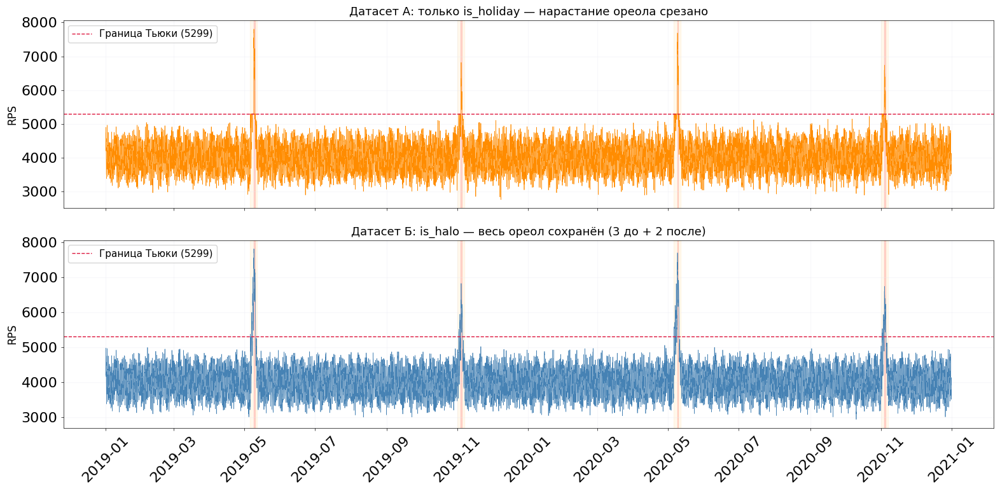

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True)

for ax, (df_plot, title, color) in zip(axes, [
    (df_a, 'Датасет А: только is_holiday — нарастание ореола срезано', 'darkorange'),
    (df_b, 'Датасет Б: is_halo — весь ореол сохранён (3 до + 2 после)', 'steelblue'),
]):
    ax.plot(df_plot['ds'], df_plot['y'], color=color, linewidth=0.5, zorder=2)
    ax.axhline(upper_fence, color='crimson', linestyle='--',
               linewidth=1.0, label=f'Граница Тьюки ({upper_fence:.0f})')
    for date, (name, _) in sorted(DEMO_HOLS.items()):
        ts = pd.Timestamp(date)
        ax.axvspan(ts - pd.Timedelta(days=HALO_BEFORE), ts,
                   alpha=0.15, color='#FFD580', zorder=0)
        ax.axvspan(ts, ts + pd.Timedelta(days=1),
                   alpha=0.35, color='#FF9999', zorder=0)
        ax.axvspan(ts + pd.Timedelta(days=1),
                   ts + pd.Timedelta(days=1 + HALO_AFTER),
                   alpha=0.15, color='#FFD580', zorder=0)
    ax.set_ylabel('RPS', fontsize=12)
    ax.set_title(title, fontsize=13)
    ax.legend(fontsize=11)
    ax.grid(alpha=0.3)

axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=2))
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.savefig('halo_preprocessing.svg', format='svg', bbox_inches='tight')
plt.show()


In [ ]:
from neuralprophet import NeuralProphet
from sklearn.metrics import mean_absolute_error

NP_KWARGS = dict(
    n_forecasts=1,
    n_lags=0,               # без AR: нет загрязнения лагами праздничного дня
    weekly_seasonality=True,
    daily_seasonality=True,
    yearly_seasonality=False,
    epochs=100,
    learning_rate=0.003,
    batch_size=128,
)

COLS_A = ['ds', 'y', 'is_holiday']
COLS_B = ['ds', 'y', 'is_holiday', 'is_halo',
          'days_to_holiday', 'days_since_holiday',
          'halo_signal', 'post_halo_signal']

df_train_a = df_a[df_a['ds'] < '2020-01-01'][COLS_A].reset_index(drop=True)
df_train_b = df_b[df_b['ds'] < '2020-01-01'][COLS_B].reset_index(drop=True)

# Модель А
print("── Модель А ──")
model_a = NeuralProphet(**NP_KWARGS)
model_a.add_future_regressor('is_holiday')
model_a.fit(df_train_a, freq='H')

# Модель Б
print("── Модель Б ──")
model_b = NeuralProphet(**NP_KWARGS)
for feat in ['is_holiday', 'is_halo', 'days_to_holiday',
             'days_since_holiday', 'halo_signal', 'post_halo_signal']:
    model_b.add_future_regressor(feat)
model_b.fit(df_train_b, freq='H')

# Предсказания на тестовом периоде (май 2020)
df_pred_a = df_a[df_a['ds'] >= '2020-05-01'][COLS_A].reset_index(drop=True)
df_pred_b = df_b[df_b['ds'] >= '2020-05-01'][COLS_B].reset_index(drop=True)

fc_a = model_a.predict(df_pred_a).dropna(subset=['yhat1'])
fc_b = model_b.predict(df_pred_b).dropna(subset=['yhat1'])

y_true_a = df_halo.set_index('ds').reindex(fc_a['ds'])['y'].values
y_true_b = df_halo.set_index('ds').reindex(fc_b['ds'])['y'].values
mae_a    = mean_absolute_error(y_true_a, fc_a['yhat1'].values)
mae_b    = mean_absolute_error(y_true_b, fc_b['yhat1'].values)
print(f"\nMAE модель А (is_holiday, без ореола)              : {mae_a:.1f} RPS")
print(f"MAE модель Б (halo + post_halo_signal, STL-очистка): {mae_b:.1f} RPS")
print(f"Улучшение: {mae_a - mae_b:.1f} RPS  ({100*(mae_a-mae_b)/mae_a:.1f}%)")

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.989% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.989% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H


── Модель А ──


INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.


Training: 0it [00:00, ?it/s]

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.989% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.989% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.


── Модель Б ──


Training: 0it [00:00, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.983% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.983% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.983% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.983% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H


Predicting: 69it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.983% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.983% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.983% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.983% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H


Predicting: 69it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column



MAE модель А (is_holiday, без ореола)              : 224.1 RPS
MAE модель Б (halo + post_halo_signal, STL-очистка): 174.7 RPS
Улучшение: 49.4 RPS  (22.0%)


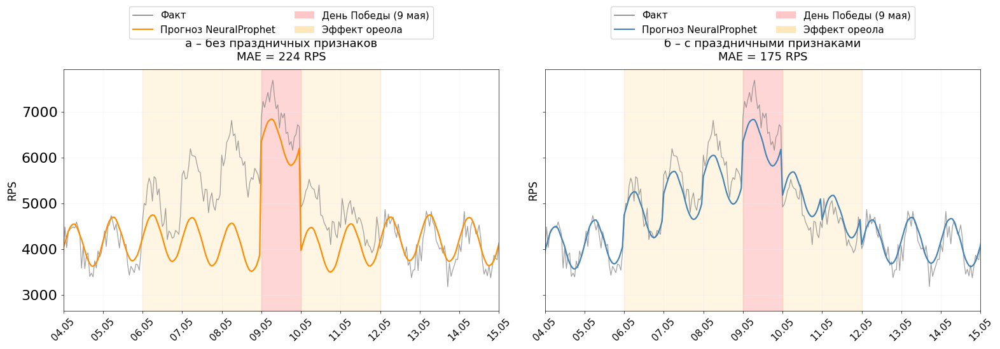

In [ ]:
xlim   = (pd.Timestamp('2020-05-04'), pd.Timestamp('2020-05-15'))
ts_hol = pd.Timestamp('2020-05-09')

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

panels = [
    (fc_a['ds'].values, fc_a['yhat1'].values, y_true_a,
     'darkorange', f'а – без праздничных признаков\nMAE = {mae_a:.0f} RPS'),
    (fc_b['ds'].values, fc_b['yhat1'].values, y_true_b,
     'steelblue',  f'б – с праздничными признаками\nMAE = {mae_b:.0f} RPS'),
]

for ax, (ds, preds, y_true, color, title) in zip(axes, panels):
    ax.plot(ds, y_true, color='gray',  linewidth=0.9, alpha=0.75, label='Факт')
    ax.plot(ds, preds,  color=color,   linewidth=1.6, label='Прогноз NeuralProphet')
    ax.axvspan(ts_hol - pd.Timedelta(days=HALO_BEFORE), ts_hol,
               alpha=0.22, color='#FFD580', zorder=0)
    ax.axvspan(ts_hol, ts_hol + pd.Timedelta(days=1),
               alpha=0.40, color='#FF9999', zorder=0)
    ax.axvspan(ts_hol + pd.Timedelta(days=1),
               ts_hol + pd.Timedelta(days=1 + HALO_AFTER),
               alpha=0.22, color='#FFD580', zorder=0)
    ax.set_xlim(*xlim)
    ax.set_ylabel('RPS', fontsize=12)
    ax.set_title(title, fontsize=13, pad=10)
    ax.xaxis.set_major_locator(mdates.DayLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m'))
    ax.tick_params(axis='x', rotation=45, labelsize=11)
    ax.grid(alpha=0.3)
    ax.legend(
        handles=[
            mlines.Line2D([], [], color='gray',  linewidth=1.2, label='Факт'),
            mlines.Line2D([], [], color=color,   linewidth=1.6, label='Прогноз NeuralProphet'),
            mpatches.Patch(facecolor='#FF9999', alpha=0.55, label='День Победы (9 мая)'),
            mpatches.Patch(facecolor='#FFD580', alpha=0.55, label='Эффект ореола'),
        ],
        loc='upper center', bbox_to_anchor=(0.5, 1.28), ncol=2, fontsize=11,
    )

plt.tight_layout()
plt.savefig('halo_comparison.svg', format='svg', bbox_inches='tight')
plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

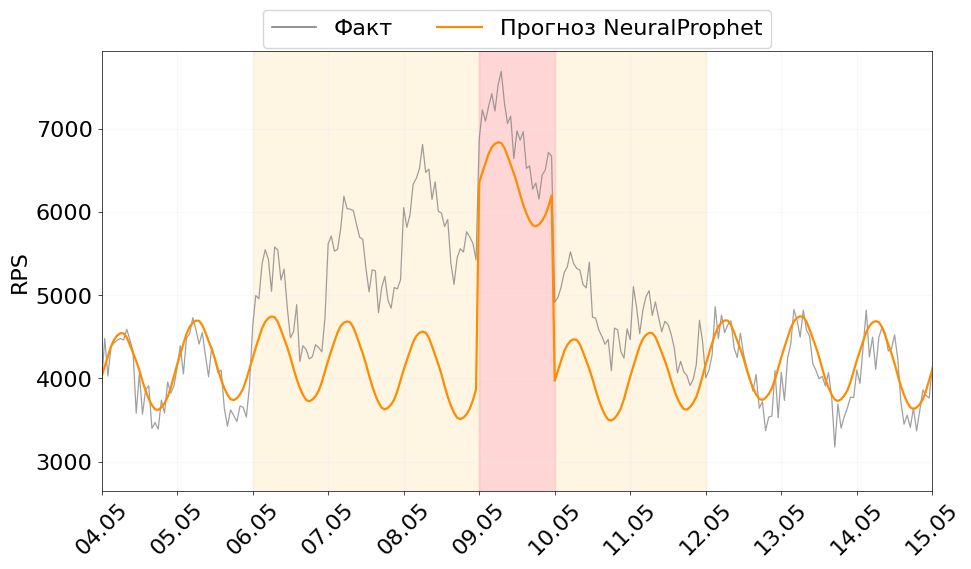

In [47]:
# 1. Меняем создание фигуры: вместо 1x2 делаем 1x1
fig, ax = plt.subplots(1, 1, figsize=(10, 6), sharey=False)

# 2. Берём только данные первого графика
ds    = fc_a['ds'].values
preds = fc_a['yhat1'].values
y_true = y_true_a
color = 'darkorange'
# title = f'а – без праздничных признаков\nMAE = {mae_a:.0f} RPS'

# 3. Рисуем всё на одном ax (вместо цикла)
ax.plot(ds, y_true, color='gray', linewidth=0.9, alpha=0.75, label='Факт')
ax.plot(ds, preds, color=color, linewidth=1.6, label='Прогноз NeuralProphet')

ax.axvspan(ts_hol - pd.Timedelta(days=HALO_BEFORE), ts_hol,
           alpha=0.22, color='#FFD580', zorder=0)
ax.axvspan(ts_hol, ts_hol + pd.Timedelta(days=1),
           alpha=0.40, color='#FF9999', zorder=0)
ax.axvspan(ts_hol + pd.Timedelta(days=1),
           ts_hol + pd.Timedelta(days=1 + HALO_AFTER),
           alpha=0.22, color='#FFD580', zorder=0)

ax.set_xlim(*xlim)
ax.set_ylabel('RPS', fontsize=16)
# ax.set_title(title, fontsize=13, pad=10)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m'))
ax.tick_params(axis='x', rotation=45, labelsize=16)

ax.grid(alpha=0.3)

ax.legend(
    handles=[
        mlines.Line2D([], [], color='gray', linewidth=1.2, label='Факт'),
        mlines.Line2D([], [], color=color, linewidth=1.6, label='Прогноз NeuralProphet'),
        # mpatches.Patch(facecolor='#FF9999', alpha=0.55, label='День Победы (9 мая)'),
        # mpatches.Patch(facecolor='#FFD580', alpha=0.55, label='Праздничный эффект'),
    ],
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=2,
    fontsize=16,
)

plt.tight_layout()
plt.savefig('halo_plot_only_a.svg', format='svg', bbox_inches='tight')
files.download('halo_plot_only_a.svg')
plt.show()

## Тестирование аномалий

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

np.random.seed(77)
df_noisy = df_halo.copy()

rps_max_train = float(df_halo[df_halo['ds'] < '2020-01-01']['y'].max())

normal_idx = df_noisy[
    (df_noisy['ds'] >= '2020-05-06') &
    (df_noisy['ds'] <  '2020-05-15') &
    (df_noisy['ds'].dt.date.apply(lambda d: d not in demo_set))
].index
spike_idx     = np.random.choice(normal_idx, size=10, replace=False)
spike_heights = np.random.uniform(rps_max_train * 1.5, rps_max_train * 2.0, size=10)
df_noisy.loc[spike_idx, 'y'] += spike_heights

spike_ds_vals = set(df_noisy.loc[spike_idx, 'ds'].values)

train_mask_n = df_noisy['ds'] < '2020-01-01'
cleaner_demo = TimeSeriesCleaner(stl_period=24, tukey_k=1.5)
cleaner_demo.fit(df_noisy[train_mask_n].reset_index(drop=True))

test_ctx      = df_noisy[df_noisy['ds'] >= '2020-04-28'].reset_index(drop=True)
df_ctx_clean, _ = cleaner_demo.transform(test_ctx.copy())

test_noisy   = df_noisy[df_noisy['ds'] >= '2020-05-01'].reset_index(drop=True)
df_clean_out = df_ctx_clean[df_ctx_clean['ds'] >= '2020-05-01'].reset_index(drop=True)

feat_test     = df_feat[df_feat['ds'] >= '2020-05-01'].reset_index(drop=True)
is_event_test = (feat_test['is_halo'] | feat_test['is_holiday']).values.astype(bool)

raw_y = test_noisy['y'].values
cln_y = df_clean_out['y'].values

noise_mask      = np.isin(test_noisy['ds'].values, list(spike_ds_vals))
baseline_normal = float(np.percentile(cln_y[~is_event_test], 80))
peak_mask       = (cln_y > baseline_normal * 1.20) & is_event_test

print(f"rps_max_train           = {rps_max_train:.0f} RPS")
print(f"Инжектировано спайков   : {noise_mask.sum()}")
print(f"Базовый уровень (P80)   : {baseline_normal:.0f} RPS")


rps_max_train           = 7806 RPS
Инжектировано спайков   : 10
Базовый уровень (P80)   : 4405 RPS


θ (адаптивный порог)  = 4720 RPS
C_rep (target/replica)= 781 RPS


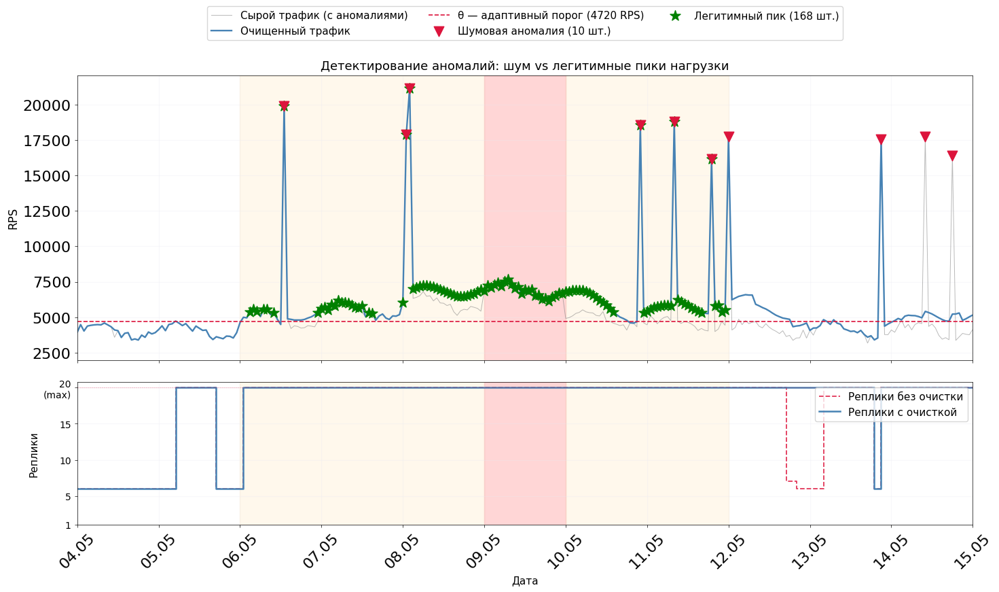


Часов на максимуме реплик без очистки : 1735
Часов на максимуме реплик с очисткой  : 1288
Избыточных пиков реплик устранено     : 476 ч


In [61]:
# Параметры по блок-схеме (Рисунок 2.9)
theta          = float(np.percentile(df_halo[df_halo['ds'] < '2020-01-01']['y'], 95))
target_per_rep = rps_max_train / 10   # C_rep
CRITICAL_RATIO = 0.95                 # α_c
WARNING_RATIO  = 0.85                 # α_w
MIN_REP        = 1
MAX_REP        = 20

print(f"θ (адаптивный порог)  = {theta:.0f} RPS")
print(f"C_rep (target/replica)= {target_per_rep:.0f} RPS")

def classify_severity(rps):
    """ρ = rps/θ → severity (по блок-схеме)."""
    rho = rps / theta
    if rho >= 1:                return 'exceeded'
    elif rho >= CRITICAL_RATIO: return 'critical'
    elif rho >= WARNING_RATIO:  return 'warning'
    else:                       return 'ok'

def rps_to_replicas(rps_arr):
    """
    Точно по блок-схеме:
      Аномалия (exceeded, ρ ≥ 1) → n_max
      Иначе → ceil(rps / C_rep), clip(n_min, n_max)
    """
    rps_arr = np.asarray(rps_arr, dtype=float)
    is_exceeded = rps_arr >= theta
    n_prop = np.clip(
        np.ceil(rps_arr / target_per_rep).astype(int),
        MIN_REP, MAX_REP
    )
    result = np.where(is_exceeded, MAX_REP, n_prop)
    return pd.Series(result).rolling(window=12, min_periods=1).max().astype(int).values

rep_raw = rps_to_replicas(raw_y)
rep_cln = rps_to_replicas(cln_y)

ds_test = pd.to_datetime(test_noisy['ds'].values)
xlim    = (pd.Timestamp('2020-05-04'), pd.Timestamp('2020-05-15'))
ts_hol  = pd.Timestamp('2020-05-09')

fig, axes = plt.subplots(2, 1, figsize=(15, 9), sharex=True,
                         gridspec_kw={'height_ratios': [3, 1.5]})

def draw_halo_bands(ax):
    ax.axvspan(ts_hol - pd.Timedelta(days=HALO_BEFORE), ts_hol,
               alpha=0.15, color='#FFD580', zorder=0)
    ax.axvspan(ts_hol, ts_hol + pd.Timedelta(days=1),
               alpha=0.40, color='#FF9999', zorder=0)
    ax.axvspan(ts_hol + pd.Timedelta(days=1),
               ts_hol + pd.Timedelta(days=1 + HALO_AFTER),
               alpha=0.15, color='#FFD580', zorder=0)

# ── Верхняя панель ──────────────────────────────────────────────────────────
ax = axes[0]
draw_halo_bands(ax)

ax.plot(ds_test, raw_y, color='gray',      linewidth=0.7, alpha=0.55,
        label='Сырой трафик (с аномалиями)')
ax.plot(ds_test, cln_y, color='steelblue', linewidth=1.7,
        label='Очищенный трафик')
ax.axhline(theta, color='crimson', linestyle='--', linewidth=1.2,
           label=f'θ — адаптивный порог ({theta:.0f} RPS)')

ax.scatter(ds_test[noise_mask], raw_y[noise_mask],
           marker='v', color='crimson', s=110, zorder=6,
           label=f'Шумовая аномалия ({noise_mask.sum()} шт.)')
if peak_mask.any():
    ax.scatter(ds_test[peak_mask], cln_y[peak_mask],
               marker='*', color='green', s=130, zorder=5,
               label=f'Легитимный пик ({peak_mask.sum()} шт.)')

ax.set_ylabel('RPS', fontsize=12)
ax.set_title('Детектирование аномалий: шум vs легитимные пики нагрузки', fontsize=13)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.26), ncol=3, fontsize=11)
ax.grid(alpha=0.3)

# ── Нижняя панель ───────────────────────────────────────────────────────────
ax2 = axes[1]
draw_halo_bands(ax2)

ax2.step(ds_test, rep_raw, color='crimson',   linewidth=1.3,
         where='post', linestyle='--', alpha=0.85, label='Реплики без очистки')
ax2.step(ds_test, rep_cln, color='steelblue', linewidth=1.8,
         where='post', label='Реплики с очисткой')
ax2.axhline(MAX_REP, color='crimson', linestyle=':', linewidth=0.8, alpha=0.5)

ax2.set_yticks([1, 5, 10, 15, MAX_REP])
ax2.set_yticklabels(['1', '5', '10', '15', f'{MAX_REP}\n(max)'], fontsize=10)
ax2.set_ylabel('Реплики', fontsize=11)
ax2.set_xlabel('Дата', fontsize=11)
ax2.legend(loc='upper right', fontsize=11)
ax2.grid(alpha=0.3)

ax2.set_xlim(*xlim)
ax2.xaxis.set_major_locator(mdates.DayLocator())
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m'))
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('anomaly_replicas.svg', format='svg', bbox_inches='tight')
plt.show()

spurious = int(np.sum((rep_raw == MAX_REP) & (rep_cln < MAX_REP)))
print(f"\nЧасов на максимуме реплик без очистки : {(rep_raw == MAX_REP).sum()}")
print(f"Часов на максимуме реплик с очисткой  : {(rep_cln == MAX_REP).sum()}")
print(f"Избыточных пиков реплик устранено     : {spurious} ч")


# Прогнозирование праздников

Train: 2019-01-01 → 2019-12-31
Val  : 2020-01-01   → 2020-04-30
Test : 2020-05-01  → 2020-12-31


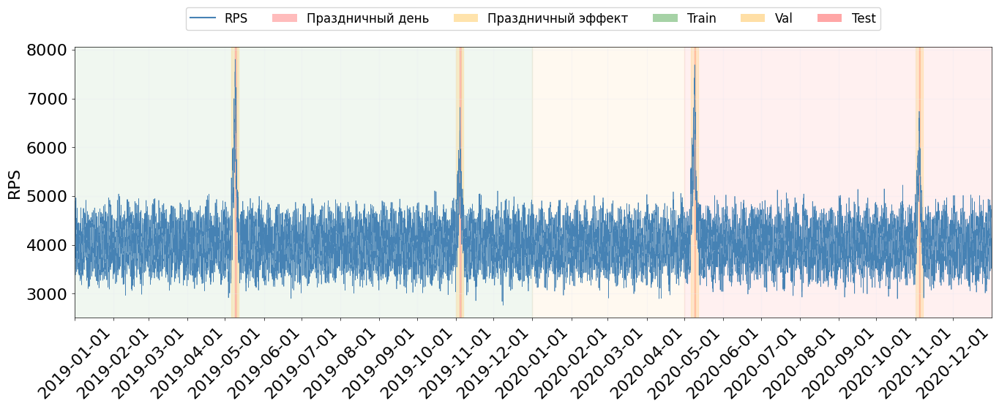

In [ ]:
import os, sys
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

np.random.seed(42)

HALO_BEFORE = 3
HALO_AFTER  = 2

# ── Только 2 праздника: 9 мая и 4 ноября ─────────────────────────────────────
DEMO_HOLS = {}
for year in [2019, 2020]:
    DEMO_HOLS[datetime.date(year, 5,  9)] = ('День Победы',   1.7)
    DEMO_HOLS[datetime.date(year, 11, 4)] = ('День единства',  1.1)

ru_set = set(DEMO_HOLS.keys())

def holiday_weight(date):
    return DEMO_HOLS.get(date, ('', 0.0))[1]

# ── Генерация датасета (2 года) ───────────────────────────────────────────────
dates = pd.date_range('2019-01-01', '2020-12-31 23:00', freq='h')
rps   = []

for dt in dates:
    base = (4000
            + 500 * np.sin(2 * np.pi * dt.hour / 24)
            + 150 * np.sin(2 * np.pi * dt.dayofweek / 7))
    halo = 0.0
    for i in range(1, HALO_BEFORE + 1):
        d = (dt + pd.Timedelta(days=i)).date()
        if d in ru_set:
            halo += (HALO_BEFORE + 1 - i) * 400 * holiday_weight(d)
    if dt.date() in ru_set:
        halo += 1800 * holiday_weight(dt.date())
    for i in range(1, HALO_AFTER + 1):
        d = (dt - pd.Timedelta(days=i)).date()
        if d in ru_set:
            halo += (HALO_AFTER + 1 - i) * 300 * holiday_weight(d)
    rps.append(max(500, base + halo + np.random.normal(0, 180)))

df_halo = pd.DataFrame({'ds': dates, 'y': rps})

# Базовое разбиение
train_h = df_halo[df_halo['ds'] < '2020-01-01'].reset_index(drop=True)
val_h   = df_halo[(df_halo['ds'] >= '2020-01-01') &
                  (df_halo['ds'] <  '2020-05-01')].reset_index(drop=True)
test_h  = df_halo[df_halo['ds'] >= '2020-05-01'].reset_index(drop=True)

print(f"Train: {train_h['ds'].min().date()} → {train_h['ds'].max().date()}")
print(f"Val  : {val_h['ds'].min().date()}   → {val_h['ds'].max().date()}")
print(f"Test : {test_h['ds'].min().date()}  → {test_h['ds'].max().date()}")

# ── Визуализация всего датасета ───────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6))

# Заливка фоном для Train, Val, Test
ax.axvspan(train_h['ds'].min(), train_h['ds'].max(), alpha=0.06, color='green',  zorder=0)
ax.axvspan(val_h['ds'].min(),   val_h['ds'].max(),   alpha=0.06, color='orange', zorder=0)
ax.axvspan(test_h['ds'].min(),  test_h['ds'].max(),  alpha=0.06, color='red',    zorder=0)

# Отрисовка праздников и их "ореолов"
for date, (name, _) in sorted(DEMO_HOLS.items()):
    ts = pd.Timestamp(date)
    ax.axvspan(
        max(ts - pd.Timedelta(days=HALO_BEFORE), df_halo['ds'].min()),
        ts, alpha=0.35, color='#FFD580', zorder=1)
    ax.axvspan(ts, ts + pd.Timedelta(days=1),
        alpha=0.50, color='#FF9999', zorder=1)
    ax.axvspan(
        ts + pd.Timedelta(days=1),
        min(ts + pd.Timedelta(days=1 + HALO_AFTER), df_halo['ds'].max()),
        alpha=0.35, color='#FFD580', zorder=1)

# Отрисовка самого временного ряда
ax.plot(df_halo['ds'], df_halo['y'], color='steelblue', linewidth=0.5, zorder=2)

# Настройка легенды
ax.legend(
    handles=[
        mlines.Line2D([], [], color='steelblue', linewidth=1.5, label='RPS'),
        mpatches.Patch(facecolor='#FF9999', alpha=0.65, label='Праздничный день'),
        mpatches.Patch(facecolor='#FFD580', alpha=0.65, label='Праздничный эффект'),
        mpatches.Patch(facecolor='green',   alpha=0.35, label='Train'),
        mpatches.Patch(facecolor='orange',  alpha=0.35, label='Val'),
        mpatches.Patch(facecolor='red',     alpha=0.35, label='Test'),
    ],
    loc='upper center', bbox_to_anchor=(0.5, 1.17),
    ncol=6, fontsize=12, frameon=True,
)

ax.set_ylabel('RPS')
ax.set_xlim(df_halo['ds'].min(), df_halo['ds'].max())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.tick_params(axis='x', rotation=45)
ax.grid(alpha=0.3)

plt.subplots_adjust(top=0.85)
plt.tight_layout()
plt.savefig('halo_dataset.svg', format='svg', bbox_inches='tight')
plt.show()

MAE: 155.1 RPS
Признаки: ['hour', 'dayofweek', 'lag_168', 'is_holiday', 'days_to_holiday', 'days_since_holiday', 'holiday_weight_feat', 'halo_signal']


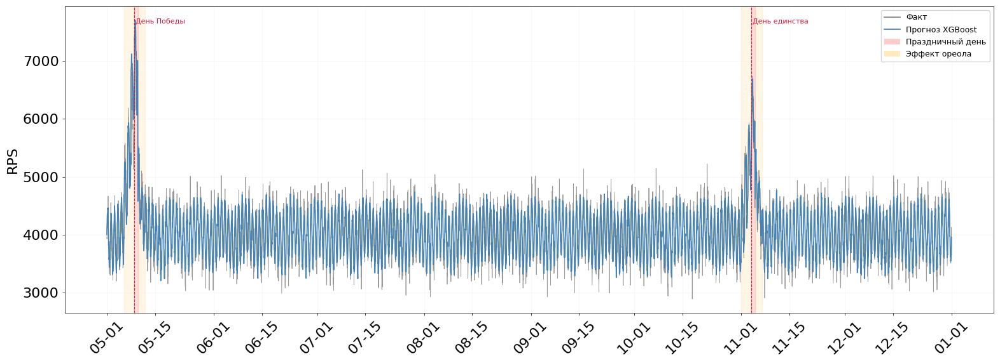

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error

def create_features(df):
    df = df.copy()
    df['hour']      = df['ds'].dt.hour
    df['dayofweek'] = df['ds'].dt.dayofweek
    df['lag_168']   = df['y'].shift(168)

    # ── Признаки приближения праздника ────────────────────────────────────────
    def days_to_next(dt):
        if dt.date() in ru_set:
            return 0                              # сегодня праздник
        for i in range(1, HALO_BEFORE + 1):
            if (dt + pd.Timedelta(days=i)).date() in ru_set:
                return i
        return HALO_BEFORE + 1                   # праздника нет поблизости

    def days_since_last(dt):
        for i in range(1, HALO_AFTER + 1):
            if (dt - pd.Timedelta(days=i)).date() in ru_set:
                return i
        return HALO_AFTER + 1

    def nearest_weight(dt):
        if dt.date() in ru_set:
            return DEMO_HOLS[dt.date()][1]
        for i in range(1, HALO_BEFORE + 1):
            d = (dt + pd.Timedelta(days=i)).date()
            if d in ru_set:
                return DEMO_HOLS[d][1]
        return 0.0

    df['is_holiday']         = df['ds'].apply(lambda dt: int(dt.date() in ru_set))
    df['days_to_holiday']    = df['ds'].apply(days_to_next)
    df['days_since_holiday'] = df['ds'].apply(days_since_last)
    df['holiday_weight_feat']= df['ds'].apply(nearest_weight)
    # Комбинированный сигнал: сила × близость праздника
    df['halo_signal'] = (
        df['days_to_holiday'].apply(lambda d: max(0, HALO_BEFORE + 1 - d))
        * df['holiday_weight_feat']
    )
    return df

df_features = create_features(df_halo).dropna()

train = df_features[df_features['ds'] < '2020-01-01']
test  = df_features[df_features['ds'] >= '2020-05-01']

X_train, y_train = train.drop(columns=['ds','y']), train['y']
X_test,  y_te    = test.drop(columns=['ds','y']),  test['y']

model = xgb.XGBRegressor(
    n_estimators=500, max_depth=6, learning_rate=0.05,
    subsample=0.8, random_state=42, n_jobs=-1
)
model.fit(X_train, y_train, eval_set=[(X_test, y_te)], verbose=False)

preds_h  = model.predict(X_test)
mae      = mean_absolute_error(y_te, preds_h)
ds_te    = test['ds'].values
y_actual = y_te.values

print(f"MAE: {mae:.1f} RPS")
print(f"Признаки: {list(X_train.columns)}")


# ── 3. ГЛАВНОЕ ИСПРАВЛЕНИЕ: Синхронизация дат ─────────────────────────────────
# Вместо среза [:len(preds_h)] мы берем даты прямо из очищенного датафрейма test.
# Так начало массива ds_te идеально совпадает с началом preds_h и y_te.
ds_te = test['ds'].values
y_actual = y_te.values

# ── 4. Визуализация ───────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(16, 6))

# Теперь длины массивов совпадают, и срезать ничего не нужно
ax.plot(ds_te, y_actual, color='gray', linewidth=0.6, alpha=0.8, label='Факт')
ax.plot(ds_te, preds_h, color='steelblue', linewidth=1.2, label='Прогноз XGBoost')

for date, (name, _) in sorted(DEMO_HOLS.items()):
    ts = pd.Timestamp(date)
    # Отрисовываем вертикальные линии, только если они попадают в наш график
    if pd.Timestamp(ds_te[0]) <= ts <= pd.Timestamp(ds_te[-1]):
        ax.axvspan(ts - pd.Timedelta(days=HALO_BEFORE), ts,
                   alpha=0.20, color='#FFD580', zorder=0)
        ax.axvspan(ts, ts + pd.Timedelta(days=1),
                   alpha=0.35, color='#FF9999', zorder=0)
        ax.axvspan(ts + pd.Timedelta(days=1),
                   ts + pd.Timedelta(days=1 + HALO_AFTER),
                   alpha=0.20, color='#FFD580', zorder=0)
        ax.axvline(ts, color='crimson', linestyle='--', linewidth=0.8, zorder=3)
        ax.text(ts + pd.Timedelta(hours=6), 0.96, name,
                fontsize=8, color='crimson', ha='left', va='top',
                transform=ax.get_xaxis_transform())

ax.legend(
    handles=[
        mlines.Line2D([], [], color='gray',      linewidth=1.2, label='Факт'),
        mlines.Line2D([], [], color='steelblue', linewidth=1.2, label='Прогноз XGBoost'),
        mpatches.Patch(facecolor='#FF9999', alpha=0.5, label='Праздничный день'),
        mpatches.Patch(facecolor='#FFD580', alpha=0.5, label='Эффект ореола'),
    ],
    loc='upper right', fontsize=9,
)

ax.set_ylabel('RPS')

# Настройка оси X
ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=[1, 15]))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.tick_params(axis='x', rotation=45)

ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('halo_forecast_fixed.svg', format='svg', bbox_inches='tight')
plt.show()

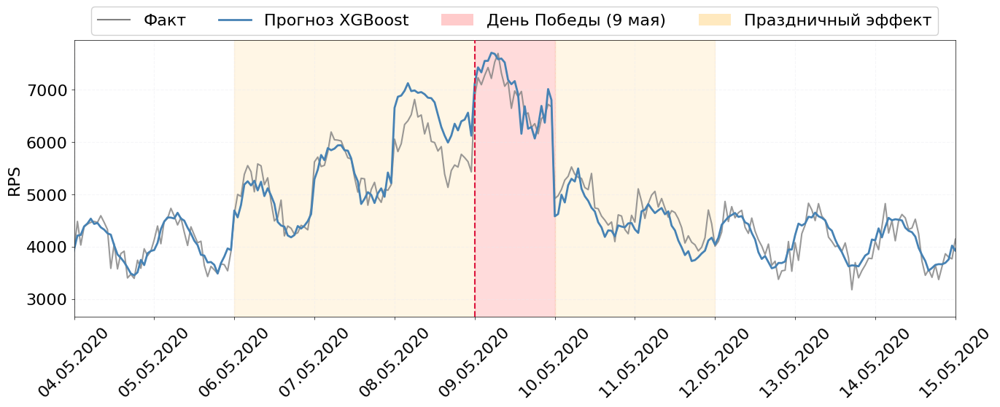

In [ ]:
# ── 3 ячейка: Детальный зум на 9 мая ──────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6))

# Строим графики (здесь я сделал линии чуть толще для лучшей читаемости вблизи)
ax.plot(ds_te, y_actual, color='gray', linewidth=1.5, alpha=0.8, label='Факт')
ax.plot(ds_te, preds_h, color='steelblue', linewidth=2.0, label='Прогноз XGBoost')

# Отрисовка зон праздника (код сам поймет, что нужно нарисовать только 9 мая)
for date, (name, _) in sorted(DEMO_HOLS.items()):
    ts = pd.Timestamp(date)
    # Закрашиваем только для 2020 года, чтобы не делать лишнюю работу
    if ts.year == 2020:
        # Ореол ДО
        ax.axvspan(ts - pd.Timedelta(days=HALO_BEFORE), ts,
                   alpha=0.20, color='#FFD580', zorder=0)
        # Сам праздник
        ax.axvspan(ts, ts + pd.Timedelta(days=1),
                   alpha=0.35, color='#FF9999', zorder=0)
        # Ореол ПОСЛЕ
        ax.axvspan(ts + pd.Timedelta(days=1),
                   ts + pd.Timedelta(days=1 + HALO_AFTER),
                   alpha=0.20, color='#FFD580', zorder=0)

        # Центральная красная линия и подпись
        ax.axvline(ts, color='crimson', linestyle='--', linewidth=1.5, zorder=3)
        # ax.text(ts + pd.Timedelta(hours=4), 0.95, name,
        #         fontsize=12, color='crimson', ha='left', va='top',
        #         transform=ax.get_xaxis_transform(), fontweight='bold')

# ── МАГИЯ ЗУМА ────────────────────────────────────────────────────────────────
# Ограничиваем ось X периодом с 4 по 15 мая 2020 года
zoom_start = pd.Timestamp('2020-05-04')
zoom_end   = pd.Timestamp('2020-05-15')
ax.set_xlim(zoom_start, zoom_end)

# Настраиваем деления оси X так, чтобы видеть каждый отдельный день
ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%Y'))
ax.tick_params(axis='x', rotation=45, labelsize=16)


# Легенда и оформление
ax.legend(
    handles=[
        mlines.Line2D([], [], color='gray',      linewidth=1.5, label='Факт'),
        mlines.Line2D([], [], color='steelblue', linewidth=2.0, label='Прогноз XGBoost'),
        mpatches.Patch(facecolor='#FF9999', alpha=0.5, label='День Победы (9 мая)'),
        mpatches.Patch(facecolor='#FFD580', alpha=0.5, label='Праздничный эффект'),
    ],
    loc='upper center',          # Центр сверху
    bbox_to_anchor=(0.5, 1.15),  # Поднять над графиком (1.15 = выше оси)
    ncol=4,                      # 4 элемента в одну строку
    fontsize=16,
    framealpha=0.9,
    fancybox=True,
    shadow=False
)

ax.set_ylabel('RPS')
# ax.set_title('Детальный разбор прогноза: Пик 9 мая и эффект ореола', fontsize=14, pad=15)
ax.grid(alpha=0.4, linestyle='--')

plt.tight_layout()
plt.savefig('halo_zoom_may9.svg', format='svg', bbox_inches='tight')
plt.show()

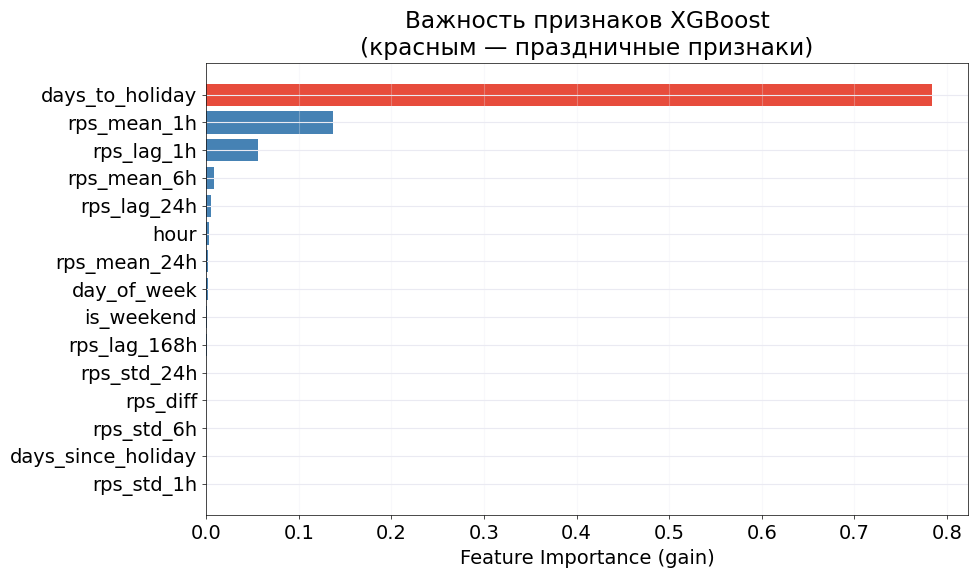


Праздничные признаки:
  days_to_holiday: importance=0.7837  (ранг 1/15)
  days_since_holiday: importance=0.0000  (ранг 14/15)


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

importances = model_h.feature_importances_
feat_names  = X_tr.columns.tolist()

fi = pd.Series(importances, index=feat_names).sort_values(ascending=True)

# Выделяем праздничные признаки цветом
colors = ['#e74c3c' if 'holiday' in f else 'steelblue' for f in fi.index]

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(fi.index, fi.values, color=colors)
ax.set_xlabel('Feature Importance (gain)')
ax.set_title('Важность признаков XGBoost\n(красным — праздничные признаки)')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig('feature_importance_holiday.svg', format='svg', bbox_inches='tight')
plt.show()

print('\nПраздничные признаки:')
for f in ['days_to_holiday', 'days_since_holiday', 'holiday_weight']:
    if f in feat_names:
        rank = sorted(feat_names, key=lambda x: dict(zip(feat_names, importances))[x], reverse=True).index(f) + 1
        print(f'  {f}: importance={dict(zip(feat_names, importances))[f]:.4f}  (ранг {rank}/{len(feat_names)})')

## §4.4 — Итоговая сводка и экспорт

In [ ]:
import os, pandas as pd, numpy as np

print('=' * 60)
print('ИТОГОВАЯ СВОДКА ЭКСПЕРИМЕНТА')
print('=' * 60)

print('\n§4.1  Сравнение моделей:')
display(metrics_df[['MAE','RMSE','MAPE']].round(2))

print(f'\n§4.2  Детекция пиков:')
print(f'  Порог: {summary_pk["threshold"]:.0f} RPS')
print(f'  Пиков: {summary_pk["peaks_detected"]} / {summary_pk["total_points"]} ({summary_pk["peak_ratio_pct"]}%)')

print(f'\n§4.3  Walk-Forward:')
print(f'  MAE адаптивная   : {summary_wf["mae_adaptive"]}')
print(f'  MAE фиксированная: {summary_wf["mae_baseline"]}')
print(f'  Улучшение        : {summary_wf["improvement_pct"]}%')
print(f'  Переобучений     : {summary_wf["n_retrains"]}')

summary_row = {
    'best_model':         best_name,
    **{f'{n}_mae': v.get('MAE') for n, v in comparator.results_.items()},
    'peak_threshold':     summary_pk['threshold'],
    'peaks_detected':     summary_pk['peaks_detected'],
    'wf_mae_adaptive':    summary_wf['mae_adaptive'],
    'wf_mae_baseline':    summary_wf['mae_baseline'],
    'wf_improvement_pct': summary_wf['improvement_pct'],
    'wf_n_retrains':      summary_wf['n_retrains'],
}
pd.DataFrame([summary_row]).to_csv(f'{SAVE_DIR}/experiment_summary.csv', index=False)

print(f'\nВсе файлы в {SAVE_DIR}/')
for f in sorted(os.listdir(SAVE_DIR)):
    kb = os.path.getsize(os.path.join(SAVE_DIR, f)) / 1024
    print(f'  {f:<45} {kb:.1f} KB')

ИТОГОВАЯ СВОДКА ЭКСПЕРИМЕНТА

§4.1  Сравнение моделей:


,MAE,RMSE,MAPE
Модель,,,
XGBoost,341.00,549.86,5.64
LSTM,601.58,860.66,9.61
NeuralProphet,635.06,849.99,12.41



§4.2  Детекция пиков:
  Порог: 6090 RPS
  Пиков: 141 / 360 (39.17%)

§4.3  Walk-Forward:
  MAE адаптивная   : 1715.606
  MAE фиксированная: 1748.136
  Улучшение        : 1.9%
  Переобучений     : 1

Все файлы в /content/results/
  best_XGBoost.pkl                              300.7 KB
  data_split.png                                127.1 KB
  experiment_summary.csv                        0.2 KB
  lstm.keras                                    435.9 KB
  lstm.meta.pkl                                 1.5 KB
  metrics_comparison.csv                        0.1 KB
  neural_prophet.np                             24.1 KB
  peak_detection.png                            148.0 KB
  replicas_recommendation.png                   157.9 KB
  retrain_intervals.png                         40.1 KB
  test.csv                                      15.4 KB
  train.csv                                     61.6 KB
  val.csv                                       15.5 KB
  walk_forward_log.csv                  